## Practival Computer Vision + 추가 공부 내용
 - 논문 내용이 대다수이나, 추가로 공부한 내용도 기록하였음.


In [2]:
import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


### 1. Computer Vision

- 이미지에서 볼 수 있는 나무, 산, 눈, 하늘, 사람들등의 정보를 추출하는 것을 흔히 이미지 분류라고 한다.
- 미리 정의된 범주 집합으로 이미지에 레이블을 지정한다. 이 경우엔 라벨은 이미지에서 볼 수 있는 것들이다.
- 이미지에서 눈, 산, 하늘이 어디에 있는지 정확한 경계를 만드는 것은 어렵지만, 우리는 여전히 각각의 이미지에 대한 대략적인 영역을 식별할 수 있다. 이것은 종종 영상의 분할이라고 불리며, 여기서 우리는 그것을 객체 점유에 따라 영역으로 나눕니다.
- 스키장의 이미지에는 산과 하늘, 사람들이 있다. 
- 사람들은 앉아있고, 각자 다른 활동들을 하고 있지만, 우리는 사람들을 탐지하고,주위에 경계 상자를 만들 수 있다. 
- 상자 탐지 및 분류에 대한 이러한 결합된 관찰을 개체 탐지라고 합니다.
- 우리는 이미지 형성과 물체의 관계에 대한 직관적인 이해를 할 수 있어서, 나무들이 사람들에 비해 카메라에서 멀리 떨어져 있을 지라도, 나무가 사람보다 더 크다는 것을 안다.
- 이미지의 지오메트리에 대한 정보를 추출하는 것은 컴퓨터 비전의 또 다른 하위 분야이며, 흔히 이미지 재구성이라고 합니다.
- 이미지 분류, 개체 탐지, 개체 추적(위치 정의로 구성, 이미지 시퀸스에 걸쳐 해당 객체를 추적한다.),
  영상 지오메트리(카메라에서 사물의 깊이를 계산하는 것으로 불린다. 이미지 세계를 실제 세계와 연결)
  영상 분할(하나의 클러스터가 유사한 속성을 가질 수 있도록 이미지에 클러스터 영역을 생성. 동일한 개체에 속하는 이미지 픽셀을 클러스터링 하는것. ), 이미지 생성

### Getting start
- 이미지는 단순한 2차원 배열이며, 각 셀에는 강도 값이 포함된다. 흑백 이미지는 흰색은 0, 검은색은 1로 구성되어있다. 이를 이진 이미지라고 부르며, 흑색의 범위를 0에서 255로 '확장'하여 나타낼 수 있으며, X, Y는 픽셀 위치, z는 강도 값으로 보면 된다.
- 픽셀 강도는 객체 표현에 큰 변화룰 주지 않는다. 그러나 오히려 더 연속적인 형태를 형성한다. 

### OpenCV (CV2) 패키지 유용한 함수 10개

https://blueskyvision.tistory.com/712

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cv2

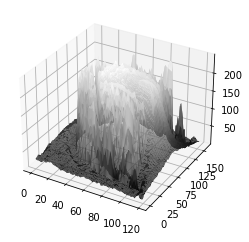

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cv2
# loads and read an image from path to file
img = cv2.imread('data_new/blackphoto.jpg',cv2.IMREAD_COLOR)
# convert the color to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# resize the image(optional)
gray = cv2.resize(gray, (160, 120))
# apply smoothing operation
gray = cv2.blur(gray,(3,3))
# create grid to plot using numpy
xx, yy = np.mgrid[0:gray.shape[0], 0:gray.shape[1]]
# create the figure
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(xx, yy, gray ,rstride=1, cstride=1, cmap=plt.cm.gray,
 linewidth=1)
# show it
plt.show()

# cv2.IMREAD_COLOR : 이미지파일은 Color로 읽어들입니다.
# cv2 IMREAD_GRAYSCALE : 이미지를 Grayscale로 읽어 들입니다 
# cv2.IMREAD_UNCHANGED : 이미지파일을 Alpha channel까지 포함하여 읽어 들입니다.
# 참조 : https://blog.naver.com/coocly/221470495157

### Reading an image
- 디지털 형식으로 저장된 이미지는 이미지를 나타내는 값을 포함하는 각 셀과 함께 그리드 구조로 구성된다. 
- 이미지를 조작하거나 추가 처리를 위해 사용하기 위해서는 이미지를 그리드 같은 구조로 사용해야 한다.


In [5]:
import cv2
# loads and read an image from path to file
img = cv2.imread('data_new/IU.jpg',cv2.IMREAD_COLOR)
# displays previous image
cv2.imshow("Image",img)
# keeps the window open until a key is pressed
cv2.waitKey(0)
# clears all window buffers
cv2.destroyAllWindows() #창으로 구현된다



### Image color conversions 
- 이미지는 픽셀 단위로 구성되며 일반적으로 저장된 값에 따라 시각화 되나, 다른 종류의 이미지를 만드는 추가적인 속성도 있다.

#### 컬러 이미지를 흑백 이미지로 바꾸기
####  Grayscale : 0 ~ 255 범위의 값을 가진 단순한 단일 채널 이미지.

In [6]:
import cv2
# loads and read an image from path to file
img = cv2.imread('data_new/IU.jpg')
# convert the color to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# displays previous image
cv2.imshow("Image",gray)
# keeps the window open until a key is pressed
cv2.waitKey(0)
# clears all window buffers
cv2.destroyAllWindows() #윈도우 창으로 구현하기


In [7]:
# • HSV and HLS: H는 색조, S는 포화도, H는 값, L은 가벼움을 나타내며, 인간의 인식 체계에 의해 동기 부여된다.
# convert the color to hsv
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
# convert the color to hls
hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)


# BGR 형식으로 판독된 입력 영상이 각 HLS(왼쪽) 및 HSV(오른쪽) 색상 유형으로 변환

In [8]:
# LAB color space :  L은 가벼움, A는 녹색-빨간색, B는 파란색으로 구분되며, 모든 지각 가능한 색으로 구성됩니다.
# 이것은 장치 독립성 특성 때문에 RGB와 같은 한 종류의 색 공간을 다른 색 공간으로 변환하는 데 사용된다.


#### CIFAR-10  로드하기.


In [ ]:
from __future__ import print_function
from tensorflow.keras.datasets import cifar10
import matplotlib.pyplot as plt
# Download and load dataset
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
labels = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship',
'truck']
# to know the size of data
print("Train data shape:", x_train.shape, "Test data shape:", x_test.shape)
# plot sample image
idx = 1500
print("Label:",labels[y_train[idx][0]])
plt.imshow(x_train[idx])
plt.axis('off')
plt.show()


## Image Filtering and Transformations in OpenCV


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
# With jupyter notebook uncomment below line
# %matplotlib inline
# This plots figures inside the notebook
img = cv2.imread('data_new/IU.jpg')
print(type(img))


<class 'numpy.ndarray'>


In [10]:
def plot_cv_img(input_image):
 """
 Converts an image from BGR to RGB and plots
 """
 # change color channels order for matplotlib
 plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
 # For easier view, turn off axis around image
 plt.axis('off')
 plt.show()


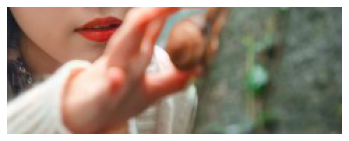

In [11]:
# 이미지는 array로 되어 있기 때문에, 배열 슬라이싱을 사용하여 자를 수 있다.
plot_cv_img(img[100:400, 100:400]) 

### Image manipulation (이미지 조작)
  - 이미지는 각 그리드 셀이 픽셀이라고 하는 그리드 유사 구조로 되어있으며, 픽셀은 값을 저장한다.
  - 단순 그레이스케일 이미지의 경우, 이러한 픽셀은 0에서 255까지까지 범위의 정수값을 가지며, 픽셀 값이 변경되면 영상 또한 바뀐다.
  - 이미지 조작 기술 기본기 중 하나는 픽셀 값을 변경하는 것.
  - 

In [12]:
# 이미지 불러오기
img = cv2.imread('data_new/IU.jpg')

# 이미지를 그레이 스케일로 변경하기
gray_output = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


In [13]:
cv2.imshow("Image",gray_output)
# keeps the window open until a key is pressed
cv2.waitKey(0)
# clears all window buffers
cv2.destroyAllWindows()



In [14]:
# 이미지가 gray가 아닐 경우, 그레이 스케일로 바꿔주기
def plot_cv_img(input_image,is_gray=False):
     """
     Takes in image with flag showing, if gray or not
     Plots image using matplotlib
     """
     # change color channels order for matplotlib
     if not is_gray:
         plt.imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
     else:
         plt.imshow(input_image, cmap='gray')
     # For easier view, turn off axis around image
     plt.axis('off')
     plt.show()


In [15]:
flower = cv2.imread('data_new/IU.jpg')


In [16]:
len(flower), len(flower[0])

(191, 340)

In [17]:
# read the image
flower = cv2.imread('data_new/IU.jpg')
# convert to gray scale
gray_flower = cv2.cvtColor(flower, cv2.COLOR_BGR2GRAY)
# take out a patch of pixels
patch_gray = gray_flower[250:260, 250:260]
#plot the patch as well as print the values
plot_cv_img(patch_gray, is_gray=True)
print(patch_gray)


D:\anaconda\envs\python36\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  # This is added back by InteractiveShellApp.init_path()


[]


### value가 낮은 부분은 더 어두운 영역을 나타낸다

### 필터에 대한 소개
- 필터는 다른 컴퓨터 비전 작업에 사용할 수 있도록 수정하거나 필요한 정보를 제공하기 위한 이미지 작업
- 이미지 노이즈 제거, 이미지 가장자리 추출, 이미지 흐림, 원하지 않는 개체 제거 등 다양한 기능을 수행
- 이미지에 노이즈를 발생시키거나 이미지에 불필요한 정보를 초래할 수 있는 몇 가지 요인이 있기 때문에 필터링 기술이 필요
- 햇빛을 받으며 사진을 찍거나, 이미지에 밝고 어두운 부분이 많거나, 야간과 같은 부적절한 환경을 유도하면 카메라에 포착된 이미지에 잡음이 많이 발생할 수 있다
- 또한 이미지에서 원하지 않는 개체나 색상의 경우 이러한 개체는 노이즈로도 간주


In [18]:
# 노이즈 이미지 생성하기
# initialize noise image with zeros
noise = np.zeros((191, 340))
# fill the image with random numbers in given range
cv2.randu(noise, 0, 256)


array([[1.35752395e+02, 5.10103553e+01, 1.02671217e+02, ...,
        5.63770664e+01, 4.07654499e+01, 1.50738868e+02],
       [2.28451280e+02, 1.97969794e+02, 2.54888237e+02, ...,
        2.32313917e+02, 3.87816482e+01, 1.18968675e+02],
       [1.37030419e+01, 2.11112095e+02, 2.49443889e+02, ...,
        2.20991369e+02, 2.33141627e+02, 2.42830642e+02],
       ...,
       [2.36420474e+02, 3.66491478e+01, 1.68329956e+02, ...,
        8.62681246e+01, 5.11284111e+01, 1.68966491e+02],
       [1.10915580e+02, 1.38393765e+02, 7.84259965e+01, ...,
        2.13136974e+02, 1.90699299e-01, 2.46630348e+02],
       [1.25923896e+02, 8.57982272e+01, 1.81369384e+02, ...,
        2.79925818e+01, 1.33629677e+02, 5.06043360e+01]])

In [19]:
noisy_gray = gray_output + np.array(0.2*noise, dtype=np.int)

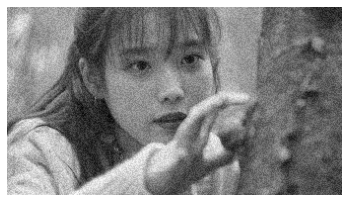

[]


In [20]:
plot_cv_img(noisy_gray, is_gray=True)
print(patch_gray)

- 노이즈는 특히 다음 장에서 딥 러닝 기반 모델을 사용할 때 시스템 기능을 향상시키는 데 중요한 역할을 한다
- 노이즈는 애플리케이션 정밀도를 테스트하기 위해 이미지에 의도적으로 추가된다

## Linear filters 
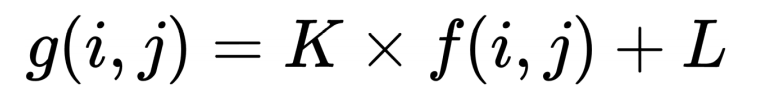

In [21]:
# 가장 간단한 필터 : 선형 필터 (포인트 연산자)
# 스칼라 값에 의한 곱셈 외에 픽셀을 상수 값으로 증가하거나 감소시킬 수 있다.
# 입력영상에 대한 픽셀 값은 f(i,j)이며 g(i,j)는 출력 픽셀 값, 

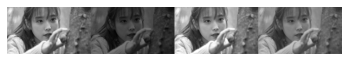

In [22]:
# K를 변경하면 이미지의 밝기가 변경되고 L을 변경하면 이미지의 대비가 변경됩니다.

import numpy as np
import matplotlib.pyplot as plt
import cv2
def point_operation(img, K, L):
    """
    Applies point operation to given grayscale image
    """
    img = np.asarray(img, dtype=np.float)
    img = img*K + L
    # clip pixel values
    img[img > 255] = 255
    img[img < 0] = 0
    return np.asarray(img, dtype = np.int)
def main():
    # read an image
    img = cv2.imread('data_new/IU.jpg')
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # k = 0.5, l = 0
    out1 = point_operation(gray, 0.5, 0)
    # k = 1., l = 10
    out2 = point_operation(gray, 1., 10)
    # k = 0.8, l = 15
    out3 = point_operation(gray, 0.7, 25)

    res = np.hstack([gray,out1, out2, out3])
    plt.imshow(res, cmap='gray')
    plt.axis('off')
    plt.show()

if __name__ == '__main__':
    main()

## 2D linear filters 
- 인접 필터에는 픽셀 주위의 로컬 영역 정보를 캡처하는 커널 매트릭스가 있다
- 커널 : 대상 픽셀 근처에서 작동하는 주어진 이미지보다 작은 매트릭스를 이야기 한다.
- 연산은 먼저 커널 매트릭스를 원본 이미지에 중첩시킨 다음 해당 픽셀의 곱을 가져와서 모든 제품의 합계를 반환함
- 원본 이미지의 하단 3 x 3 영역은 주어진 커널 매트릭스와 겹쳐지고 커널과 이미지의 해당 픽셀 값이 곱해진다.


In [23]:
# 작업은 커널을 이미지 행을 따라 슬라이딩한 다음 이미지 열을 사용하여 반복됩니다.

# design a kernel matrix, here is uniform 5x5
kernel = np.ones((5,5),np.float32)/25
# apply on the input image, here grayscale input
dst = cv2.filter2D(gray,-1,kernel)

In [24]:
dst

array([[164, 163, 162, ...,  51,  53,  52],
       [164, 164, 163, ...,  52,  53,  52],
       [165, 164, 163, ...,  51,  52,  52],
       ...,
       [218, 219, 221, ...,  72,  70,  69],
       [223, 224, 225, ...,  74,  72,  71],
       [227, 226, 226, ...,  75,  72,  71]], dtype=uint8)

- 커널이 겹치는 동안 이미지 영역 밖에 있기 때문에 코너 픽셀은 큰 영향을 미치며 더 작은 이미지를 생성하게 됩니다.
- 이로 인해 이미지의 경계와 함께 검은색 영역 또는 구멍이 발생합니다. 이를 해결하기 위해 다음과 같은 몇 가지 일반적인 기술이 사용됨
- 가장자리를 따라 외부 영역에 픽셀 미러링
- 이미지 주위에 픽셀 패턴 생성

## Box Filters
- Box Filters는 픽셀 값을 평균화하여 이미지가 흐려진다.
- 이미지의 주파수 영역 분석에서 이 필터는 로우패스 필터입니다. 주파수 영역 분석은 이미지의 푸리에 변환을 사용하여 수행되며, 이 변환은 도입 범위를 벗어난다. 커널 크기를 변경하면 이미지가 점점 흐려지는 것을 볼 수 있습니다
- 커널 크기를 늘리면 결과 이미지가 더 흐려지는 것을 관찰할 수 있다. 이는 커널이 적용된 작은 이웃의 평균 피크 값에서 벗어난 때문이다. 
- 크기가 매우 작은 필터(3, 3)를 사용하면 커널 크기가 사진 크기에 비해 상당히 작기 때문에 출력에 무시할 만한 효과가 있다

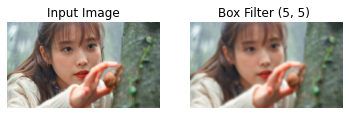

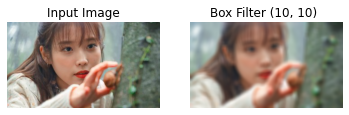

In [25]:
#  box filtered photos 

def plot_cv_img(input_image, output_image, kernel_size):
 """
 Converts an image from BGR to RGB and plots
 """
 fig, ax = plt.subplots(nrows=1, ncols=2)
 ax[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
 ax[0].set_title('Input Image')
 ax[0].axis('off')

 ax[1].imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
 ax[1].set_title(f'Box Filter {kernel_size} ')
 ax[1].axis('off')
 plt.show()

def main():
 # read an image
 img = cv2.imread('data_new/IU.jpg')


 # To try different kernel, change size here.
 kernel_size = (5,5)
 kernel_size_1 = (10,10)

 # opencv has implementation for kernel based box blurring
 blur = cv2.blur(img,kernel_size)
 blur_1 = cv2.blur(img,kernel_size_1)

 # Do plot
 plot_cv_img(img, blur, kernel_size)
 plot_cv_img(img, blur_1, kernel_size_1)
 
if __name__ == '__main__':
   main()


In [26]:
a = 'B' 
print(f'Hello : {a}')

Hello : B


## 선형 필터의 속성
- 선형 필터는 교환법칙이 성립하기 때문에 어떤 순서로든 필터에 대해 곱셈 연산을 수행할 수 있으며 결과는 그대로 유지됩니다.

  $ a \cdot b = b \cdot a$
  
  
- 필터를 적용하는 순서가 결과에 영향을 미치지 않음

  $ (a \cdot b) \cdot c = a \cdot (b \cdot c)$
  
  
  
- 두 개의 필터를 합한 경우에도 첫 합계를 수행한 다음 필터를 적용하거나, 필터를 개별적으로 적용한 후 결과를 합칠 수 있습니다. 전반적인 결과는 여전히 동일합니다.

  $ b = (k + l)\cdot a$
  
  
  
- 스케일링 팩터를 한 필터에 적용하고 다른 필터에 곱하는 것은 먼저 두 필터를 곱한 다음 스케일링 팩터를 적용하는 것과 같습니다.
- 이러한 속성은 나중에 개체 감지, 분할 등과 같은 컴퓨터 비전 작업을 볼 때 중요한 역할을 한다. 이러한 필터를 적절하게 조합하면 정보 추출 품질이 향상되고 결과적으로 정확도가 향상됩니다

## 비선형 필터
- 많은 경우 선형 필터는 필요한 결과를 얻기에 충분하지만, 다른 여러 사용 사례에서는 비선형 필터를 사용하면 성능이 크게 향상될 수 있다
-  보다 복잡한 연산으로 구성되고, 어떤 종류의 비선형성을 가지며, 결과적으로 이러한 필터는 선형 필터의 일부 또는 전부를 따르지 않는다.

## Smoothing a photo 
- 단단한 가장자리는 박스 필터를 적용해도 부드러워 지지 않는다. 이러한 점을 개선하기 위해 가장자리를 중심으로 필터를 보다 부드럽게 만들수 있다.
- 가우스 필터 : Smoothing 기법에 사용되는 대표적인 필터이며, 중심 픽셀의 효과를 높이고 픽셀이 중심에서 멀어질 수록 서서히 효과를 감소시키는 비선형 필터.
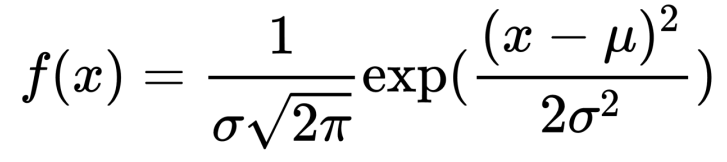
- μ는 평균이고 μ는 분산입니다.
- 2차원 이산 도메인에서 이러한 종류의 필터에 대한 커널 매트릭스의 예는 다음과 같이 주어진다.
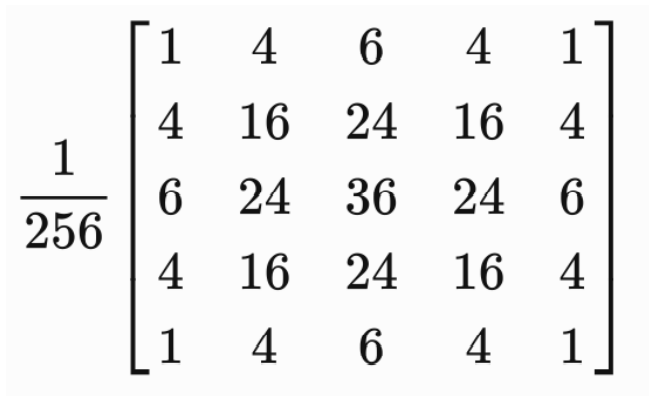

- 이 필터는 박스 필터보다 블러링 성능이 뛰어나지만 구현도 매우 우수합니다




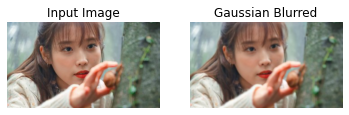

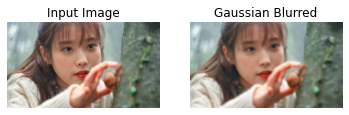

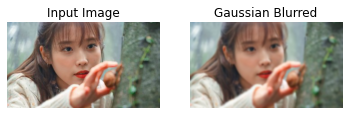

In [27]:
# 가우스 필터
# cv2.GaussianBlur(src, ksize, sigmaX, dst=None, sigmaY = None, borderType = None)


def plot_cv_img(input_image, output_image):
 """
 Converts an image from BGR to RGB and plots
 """
 fig, ax = plt.subplots(nrows=1, ncols=2)

 ax[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
 ax[0].set_title('Input Image')
 ax[0].axis('off')

 ax[1].imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
 ax[1].set_title('Gaussian Blurred')
 ax[1].axis('off')
 plt.show()

def main():
 # read an image
 img = cv2.imread('data_new/IU.jpg')

 # apply gaussian blur,

 # 여기서 사용하는 기본 kernel of size 5x5, kernel의 k는 k>1 and k % 2 == 1의 조건을 성립하여야 한다.
 # change here for other sizes
 kernel_size = (3,3)
 kernel_size_1 = (5,5)
 kernel_size_2 = (7,7)
    
 # sigma values are same in both direction
 blur = cv2.GaussianBlur(img,kernel_size,0)
 blur_1 = cv2.GaussianBlur(img,kernel_size_1,0)
 blur_2 = cv2.GaussianBlur(img,kernel_size_2,0)

 plot_cv_img(img, blur)
 plot_cv_img(img, blur_1)
 plot_cv_img(img, blur_2)

if __name__ == '__main__':
 main()

In [28]:
#k값에 따른 이미지 변화 확인해보기 
import cv2
import numpy as np

def onChange(k):
    if k % 2 == 1: # k>1 and k % 2 == 1
        dsn = cv2.GaussianBlur(img, (k, k),0)
        cv2.imshow('GaussianBlur', dsn)

img = cv2.imread('data_new/IU.jpg')
cv2.imshow('GaussianBlur', img)

cv2.createTrackbar('k', 'GaussianBlur', 0, 20, onChange)

cv2.waitKey()

cv2.destroyAllWindows()

# 참조 사이트 : https://jvvp.tistory.com/1032

## Histogram equalization 히스토그램 균등화
- 밝기 및 대비를 변경하려면 기본 포인트 연산은 사진 품질 향상에 도움이 되지만 수동 조정이 필요합니다. 히스토그램 이퀄라이제이션 기법을 사용하면 알고리즘적으로 찾을 수 있으며 더 잘 보이는 사진을 만들 수 있습니다.
-  직관적으로 이 방법은 가장 밝은 픽셀을 흰색으로, 어두운 픽셀을 검은색으로 설정하려고 합니다. 나머지 픽셀 값도 마찬가지로 크기가 조정됩니다. 이 리스케일링은 모든 강도 분포를 캡처하도록 원래 강도 분포를 변환하여 수행됩니다.

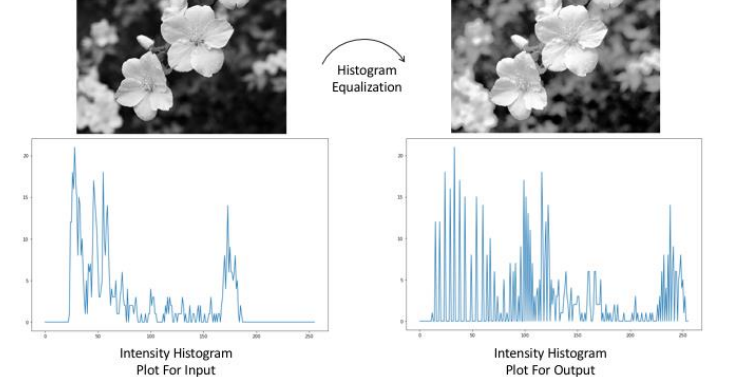

- 결과, 대비가 크게 증가합니다. 입력 히스토그램을 사용하면, 일부 색상이 영상에서 관찰되지 않는 것을 확인할 수 있습니다

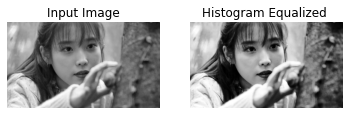

In [29]:
def plot_gray(input_image, output_image):
 """
 Converts an image from BGR to RGB and plots
 """
 # change color channels order for matplotlib
 fig, ax = plt.subplots(nrows=1, ncols=2)
 ax[0].imshow(input_image, cmap='gray')
 ax[0].set_title('Input Image')
 ax[0].axis('off')

 ax[1].imshow(output_image, cmap='gray')
 ax[1].set_title('Histogram Equalized ')
 ax[1].axis('off')

 plt.show()
def main():
 # read an image
 img = cv2.imread('data_new/IU.jpg')

 # grayscale image is used for equalization
 gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

 # following function performs equalization on input image
 equ = cv2.equalizeHist(gray)

 # for visualizing input and output side by side
 plot_gray(gray, equ)

if __name__ == '__main__':
 main()


## Median filter 
- 이 방법의 핵심 기술은 중간 값을 사용하는 것입니다. 따라서 필터는 비선형적입니다. 
- 그것은 소금과 후추와 같은 날카로운 소음을 제거하는데 꽤 유용하다.
- 이 필터는 픽셀 영역의 중간 값을 계산합니다. 이로 인해 영역에서 랜덤 피크 값이 제거됩니다

--> nxn 커널에 포함된 화소값을 최소부터 최대까지 서열화한 이후 중위수를 계산하고, 그 중위수를 윈도우의 중앙에 위치한 화소값으로 결정하는 필터.

참조 사이트 : https://terms.naver.com/entry.nhn?docId=3479314&cid=58439&categoryId=58439

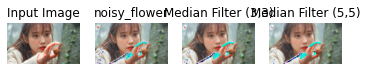

In [30]:
# ---- 필터에 노이즈 넣기 ---

# read the image
flower = cv2.imread('data_new/IU.jpg')
# initialize noise image with zeros
noise = np.zeros(flower.shape[:2])
# fill the image with random numbers in given range
cv2.randu(noise, 0, 256)
# add noise to existing image, apply channel wise
noise_factor = 0.1

noisy_flower = np.zeros(flower.shape)

for i in range(flower.shape[2]):
    noisy_flower[:,:,i] = flower[:,:,i] + np.array(noise_factor*noise, dtype=np.int)
    
    
# convert data type for use
noisy_flower = np.asarray(noisy_flower, dtype=np.uint8)

# apply median filter of kernel size 5
kernel_5 = 5
median_5 = cv2.medianBlur(noisy_flower,kernel_5)
# apply median filter of kernel size 3
kernel_3 = 3
median_3 = cv2.medianBlur(noisy_flower,kernel_3)

def plot_cv_img(input_image, output_image1, output_image2, output_image3):
     """
     Converts an image from BGR to RGB and plots
     """
     fig, ax = plt.subplots(nrows=1, ncols=4)
     ax[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
     ax[0].set_title('Input Image')
     ax[0].axis('off')

     ax[1].imshow(cv2.cvtColor(output_image1, cv2.COLOR_BGR2RGB))
     ax[1].set_title('noisy_flower')
     ax[1].axis('off')
     ax[2].imshow(cv2.cvtColor(output_image2, cv2.COLOR_BGR2RGB))
     ax[2].set_title('Median Filter (3,3)')
     ax[2].axis('off')
     ax[3].imshow(cv2.cvtColor(output_image3, cv2.COLOR_BGR2RGB))
     ax[3].set_title('Median Filter (5,5)')
     ax[3].axis('off')
plot_cv_img(flower, noisy_flower, median_3, median_5)
    

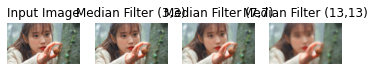

In [31]:
def plot_cv_img(input_image, output_image1, output_image2, output_image3):
 """
 Converts an image from BGR to RGB and plots
 """
 fig, ax = plt.subplots(nrows=1, ncols=4)
 ax[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
 ax[0].set_title('Input Image')
 ax[0].axis('off')

 ax[1].imshow(cv2.cvtColor(output_image1, cv2.COLOR_BGR2RGB))
 ax[1].set_title('Median Filter (3,3)')
 ax[1].axis('off')
 ax[2].imshow(cv2.cvtColor(output_image2, cv2.COLOR_BGR2RGB))
 ax[2].set_title('Median Filter (7,7)')
 ax[2].axis('off')
 ax[3].imshow(cv2.cvtColor(output_image3, cv2.COLOR_BGR2RGB))
 ax[3].set_title('Median Filter (13,13)')
 ax[3].axis('off')

 plt.show()

def main():
 # read an image
 img = cv2.imread('data_new/IU.jpg')
 # compute median filtered image varying kernel size
 median1 = cv2.medianBlur(img,3)
 median2 = cv2.medianBlur(img,7)
 median3 = cv2.medianBlur(img,13)


 # Do plot
 plot_cv_img(img, median1, median2, median3)
if __name__ == '__main__':
 main()

In [32]:
#k값에 따른 이미지 변화 확인해보기 
import cv2
import numpy as np

def onChange(k):
    if k % 2 == 1: # k>1 and k % 2 == 1
        dsn = cv2.medianBlur(img, k)
        cv2.imshow('MedianBlur', dsn)

img = cv2.imread('data_new/IU.jpg')
cv2.imshow('MedianBlur', img)

cv2.createTrackbar('k', 'MedianBlur', 0, 20, onChange)

cv2.waitKey()

cv2.destroyAllWindows()


## Image gradients (이미지의 변화도)
- 사진의 급격한 변화로 이미지 특정 부분의 가장자리를 찾을 수 있다.
- 객체 감지 및 분할 작업에 널리 사용된다.
- 이미지 파생은 방향의 변화를 계산하는 커널 매트릭스틑 적용하는 것이며, Sobel 필터는 이러한 필터 중 하나.
- Sobel 필터의 x 방향 커널
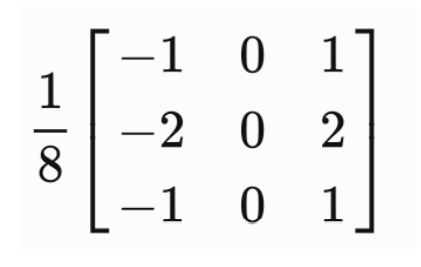
- Sobel 필터의 y 방향 커널
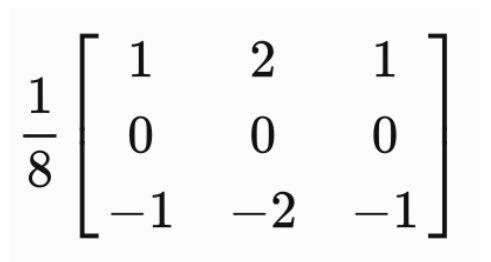
- 사진과 함께 중첩된 커널의 값을 계산하여 선형 상자 필터와 유사한 방식으로 적용된다. 그런 다음 모든 값을 계산하기 위해 이미지를 따라 필터가 이동합니다.

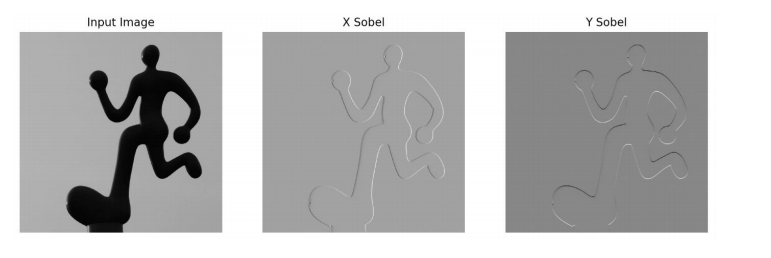

- 주어진 방향(여기서 X 또는 Y)에 관한 영상 파생물이라고도 합니다. 결과 사진이 가벼울수록(가운데와 오른쪽) 양의 구배인 반면, 어두운 영역은 음의 구배이고 회색은 0입니다.
- 소벨 필터는 사진의 1차 파생 모델에 해당하지만, 라플라시안 필터는 사진의 2차 파생 모델에 해당된다. 라플라시안 필터는 Sobel과 유사한 방식으로도 적용된다.

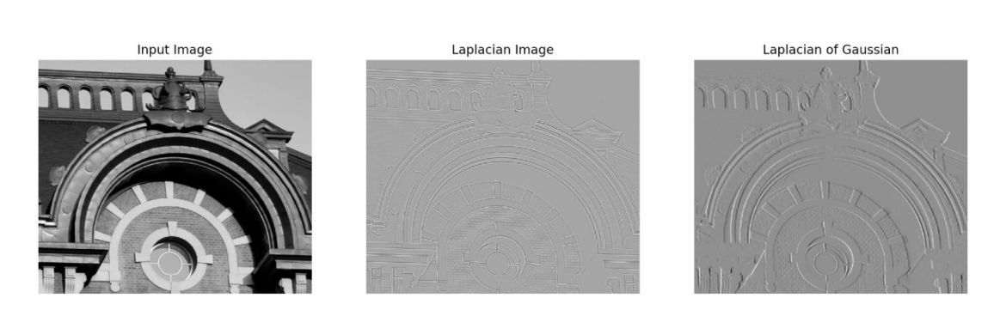

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


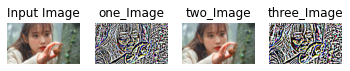

In [33]:
# CV Type?? 
# OpenCV에서 사용하는 클래스 CvTye
# public final class CvType extends java.lang.Object

# 숫자는 bit 수( 1개의 데이터를 표현할 수 있는) C1, C2, C3, C4는 channel 수
# 상세 내용 : https://docs.opencv.org/java/2.4.9/org/opencv/core/CvType.html

# sobel
x_sobel = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
y_sobel = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
# laplacian
lapl = cv2.Laplacian(img,cv2.CV_64F, ksize=5)
# gaussian blur
blur = cv2.GaussianBlur(img,(5,5),0)
# laplacian of gaussian
log = cv2.Laplacian(blur,cv2.CV_64F, ksize=5) # 가우시안 + 라플라시안
def plot_show_img(input_image, output_image1, output_image2, output_image3):
 """
 Converts an image from BGR to RGB and plots
 """
 fig, ax = plt.subplots(nrows=1, ncols=4)
 ax[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
 ax[0].set_title('Input Image')
 ax[0].axis('off')

 ax[1].imshow(output_image1)
 ax[1].set_title('one_Image')
 ax[1].axis('off')
 ax[2].imshow(cv2.cvtColor(output_image2,cv2.COLOR_BGR2RGB))
 ax[2].set_title('two_Image')
 ax[2].axis('off')
 ax[3].imshow(output_image3)
 ax[3].set_title('three_Image')
 ax[3].axis('off')

 plt.show()

plot_show_img(img, lapl, blur, log)


## Transformation of an image 
- 사진에 적용되는 기하학적 변환
- 이미지를 이동하거나, 축을 따라 이미지를 회전하거나, 다른 평면에 투영할 수 있습니다. 변환의 핵심은 우리 이미지의 매트릭스 곱셈이다.

### Translation 
- 변환에 대한 변환 매트릭스는 다음과 같으며, tx는 x 방향의 변환이며, ty는 영상 참조의 y 방향이다
- 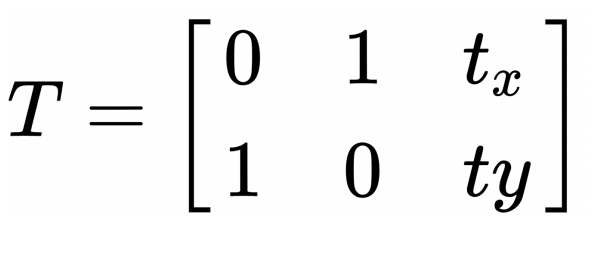



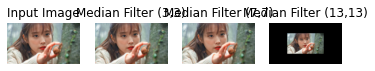

In [34]:
def plot_cv_img(input_image, output_image1, output_image2, output_image3):
 """
 Converts an image from BGR to RGB and plots
 """
 fig, ax = plt.subplots(nrows=1, ncols=4)
 ax[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
 ax[0].set_title('Input Image')
 ax[0].axis('off')

 ax[1].imshow(cv2.cvtColor(output_image1, cv2.COLOR_BGR2RGB))
 ax[1].set_title('Median Filter (3,3)')
 ax[1].axis('off')
 ax[2].imshow(cv2.cvtColor(output_image2, cv2.COLOR_BGR2RGB))
 ax[2].set_title('Median Filter (7,7)')
 ax[2].axis('off')
 ax[3].imshow(cv2.cvtColor(output_image3, cv2.COLOR_BGR2RGB))
 ax[3].set_title('Median Filter (13,13)')
 ax[3].axis('off')

 plt.show()
# input shape
flower = cv2.imread('data_new/IU.jpg')

w, h = flower.shape[1], flower.shape[0]
# create translation matrix
tx = w/2 # half of width
ty = h/2 # half of height
translation_matrix = np.float32([[1,0,tx], [0,1,ty]])
# apply translation operation using warp affine function.
output_size = (w*2,h*2)
translated_flower = cv2.warpAffine(flower, translation_matrix, output_size)
# cv2.warpAffine(image, matrix, (w,h)) => matrix는 위에서 생성한 매트릭스, (w,h)는 결과 이미지의 가로, 높이
plot_cv_img(flower, flower, flower, translated_flower)

### Rotation
- 변환과 마찬가지로, 변환 매트릭스를 생성함으로써 이미지를 회전할 수도 있습니다.
- 변환 매트릭스를 생성하는 대신, OpenCV에서 회전 각도 α가 주어지면 다음과 같은 형식의 회전 매트릭스가 생성됩니다.
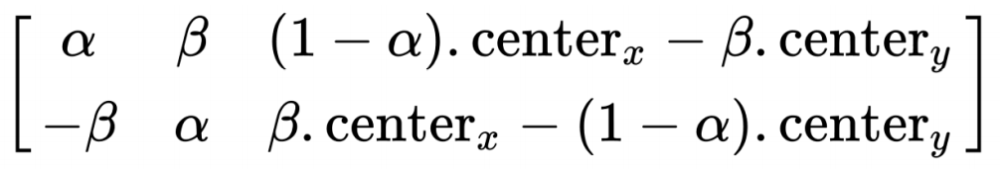
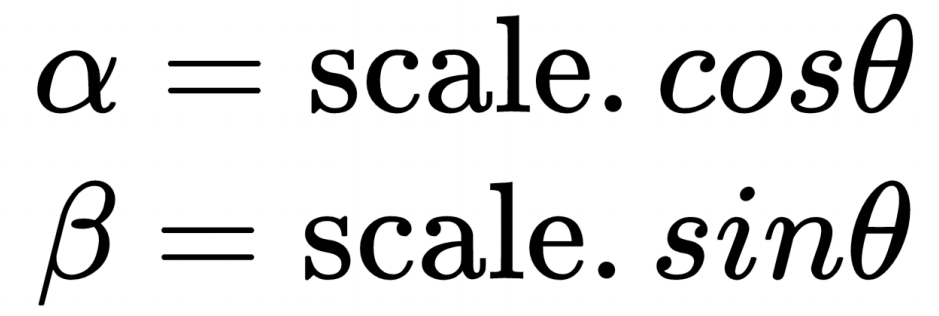

- 마찬가지로, 변환은 회전과 변환 모두를 스케일링과 결합하여 수행될 수 있으며 결과적으로 선 사이의 각도가 보존


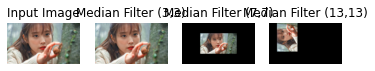

In [35]:
w, h = flower.shape[1], flower.shape[0]
# create rotation matrix
rot_angle = 90 # in degrees
scale = 1 # keep the size same
rotation_matrix = cv2.getRotationMatrix2D((w/2,h/2),rot_angle,1)
# apply rotation using warpAffine
output_size = (w*2,h*2)
rotated_flower = cv2.warpAffine(flower,rotation_matrix,output_size)
plot_cv_img(flower, flower, translated_flower, rotated_flower)

In [36]:
# 각도에 값을 주어서 돌려보자

import cv2
import numpy as np

def onRotation(rot_angle):
    rotation_matrix = cv2.getRotationMatrix2D((w/2,h/2),rot_angle,1)
    output_size = (w,h)
    rotated_flower = cv2.warpAffine(img,rotation_matrix,output_size)
    cv2.imshow('Rotation', rotated_flower)

img = cv2.imread('data_new/IU.jpg')
cv2.imshow('Rotation', img)

cv2.createTrackbar('rot_angle', 'Rotation', 0, 360, onRotation)

cv2.waitKey()

cv2.destroyAllWindows()




### Affine Space와 Affine transform 
- Affine Space 
  - 아핀 공간 : 3차원 공간에서 단순히 점들의 모임뿐만이 아니라, 직선과 평면들의 연관성을 생각하는 단계로 확장한 공간
  - 벡터 공간은 위치를 특정할 수 있는 점 개념이 없으므로, 두 벡터가 크기와 방향만 같으면 상동(서로 같음)
  - 아핀 공간은 점 개념이 존재하여 평행이동이라는 개념 도입이 가능

- Affine Transformation
  - $x' \rightarrow Ax + b$ 또는 $T(u) = Ax + b$ (b는 고정된 벡터, A는 행렬)
  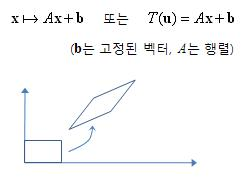
  - 행렬 A에 의해 행렬 변환한 후에 평행이동한 것과 동일(선의 평행성은 유지 되면서 전체적인 모양만 바뀜)  
  - 변환 전후에 직선은 직선으로, 다각형은 다각형으로, 곡면은 곡면으로 유지
  - 이동,  회전, 크기조절, 반사 등의 합성 변환으로 표현 가능
  - Affine 변환을 위해서는 3개의 Match가 되는 점이 필요=> (3,2) 행렬 필요
  - 함수를 통해, 이미지는 평행선은 변동이 없으며, 점의 위치에 따라 이미지가 조작.
  - 즉, pts1에 이미지의 특정 점 3개의 좌표를 입력하고, pts2에는 이동시킨 점의 위치 좌표가 필요하다. 이를 통해 이미지를 이동시킨다. 이동한 이미지는 점의 위치에 따라 회전하고 크기가 변하는 형태를 가지지만, 네모난 사진이 그 형태 그대로 이동하는 효과를 보인다.
참조 사이트 : https://blog.naver.com/qbxlvnf11/222107086112

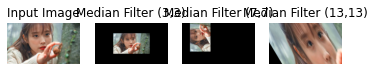

In [37]:
# create transformation matrix form preselected points
pts1 = np.float32([[20,20],[100,25],[20,50]]) #이미지 위의 점의 좌표
pts2 = np.float32([[10,100],[200,50],[100,250]]) #Affine Transform을 통해 변경될 점의 위치
affine_tr = cv2.getAffineTransform(pts1,pts2) # Affine Transform 함수
transformed = cv2.warpAffine(flower, affine_tr, (img.shape[1]*2,img.shape[0]*2))
plot_cv_img(flower, translated_flower, rotated_flower, transformed)


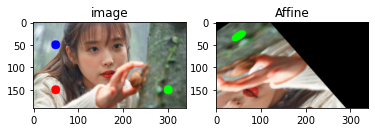

In [38]:
#-*- coding:utf-8 -*-
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('data_new/IU.jpg')
rows, cols, ch = img.shape

pts1 = np.float32([[50,50],[300,150],[50,150]]) #이미지 위의 점의 좌표
pts2 = np.float32([[50,300],[50,30],[200,200]]) #Affine Transform을 통해 변경될 점의 위치

# pts1의 좌표에 표시. Affine 변환 후 이동 점 확인.
cv2.circle(img, (50,50), 10, (255,0,0),-1)
cv2.circle(img, (300,150), 10, (0,255,0),-1)
cv2.circle(img, (50,150), 10, (0,0,255),-1)

M = cv2.getAffineTransform(pts1, pts2)

dst = cv2.warpAffine(img, M, (cols,rows))

plt.subplot(121),plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)),plt.title('image')
plt.subplot(122),plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)),plt.title('Affine')
plt.show()


In [39]:
pts1 = np.float32([[50,20],[20,50],[200,100]])
pts1.shape

(3, 2)

In [40]:
img = cv2.imread('data_new/track.jpg')
img.shape

(183, 275, 3)

## Perspective Transformation
 - Perspective(원근법) 변환은 직선의 성질만 유지가 되고, 선의 평행성은 유지가 되지 않은 변환.
 - 기차길은 서로 평행하나 원근변환을 거치면, 평행성은 유지되지 못하고 하나의 점에서 만나는 것처럼 보인다.
 - 4개의 Point의 input값과 이동할 output Point가 필요.
 - cv2.PerspectiveTransform() 함수와 cv2.warpPerspective()가 필요.
 
 
참조 사이트 : https://opencv-python.readthedocs.io/en/latest/doc/10.imageTransformation/imageTransformation.html#affine-transformation

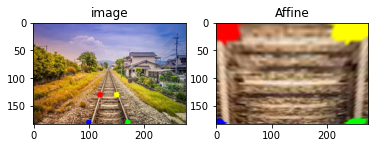

In [41]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('data_new/track.jpg')
rows, cols, ch = img.shape

pts1 = np.float32([[100,180],[170,180],[120,130], [150, 130]]) #이미지 위의 점의 좌표
pts2 = np.float32([[0,180],[250,180], [0,0], [250, 0]]) #Affine Transform을 통해 변경될 점의 위치

# pts1의 좌표에 표시. Affine 변환 후 이동 점 확인.
cv2.circle(img, (100,180), 5, (255,0,0),-1) # 파
cv2.circle(img, (170,180), 5, (0,255,0),-1) # 초
cv2.circle(img, (120,130), 5, (0,0,255),-1) # 빨
cv2.circle(img, (150,130), 5, (0,255,255),-1) # 노


M = cv2.getPerspectiveTransform(pts1, pts2)

dst = cv2.warpPerspective(img, M, (cols,rows))

plt.subplot(121),plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)),plt.title('image')
plt.subplot(122),plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)),plt.title('Affine')
plt.show()

### Image Pyramids 
- Image Pyramids는 사진의 해상도를 높이거나 줄이는 것을 말한다.
- 이것들은 종종 거대한 데이터베이스에서 이미지 매칭과 같은 컴퓨터 비전 알고리듬의 계산 효율을 증가시키는 데 사용된다.
- 이미지 일치는 다운샘플링된 이미지에서 계산되고 나중에 검색하면 이미지의 고해상도를 위해 반복적으로 세분화된다.
- 원본 이미지를 다운 샘플링하면, 도중에 정보가 손실되어, 이후에 다운 샘플링 된 이미지를 업샘플링 한다고 해서 원본 이미지로 복구되지 않는다.

- 왜 이미지 피라미드를 사용할까?
  - 영상 이미지 내에 존재하는 대상들은 촬영한 지점에서부터 먼 거리까지의 정보를 모두 가지고 있다.
  - 촬영지점에서부터 먼 거리에 있을 수록 크기가 작아진다.
  - 대상을 검출(Object Detection)을 하기 위해서는 사용자가 설정한 sub-window size 를 기준으로 연산이 진행된다.
  - 만약, 설정한 sub-window보다 매우 작은 대상일 경우, 원래 사이즈의 영상에서는 객체가 존재할지라도 이를 인식하지 못할 수 있다.
  - 이러한 문제를 해결하기 위해 sub-window 크기에 맞게 이지미를 재조정(Resize) 또는 Down-Sampling하여 영상 내 모든 대상을 검출할 수 있다.
  
내용 참조 : https://blog.naver.com/natalliea/222198213575

- Down-sampling 
  - 원 샘플(Original Sample)의 비율를 낮추면서 데이터(또는 사이즈) 크기가 감소하지만, 해상도가 낮아지게 된다.
  


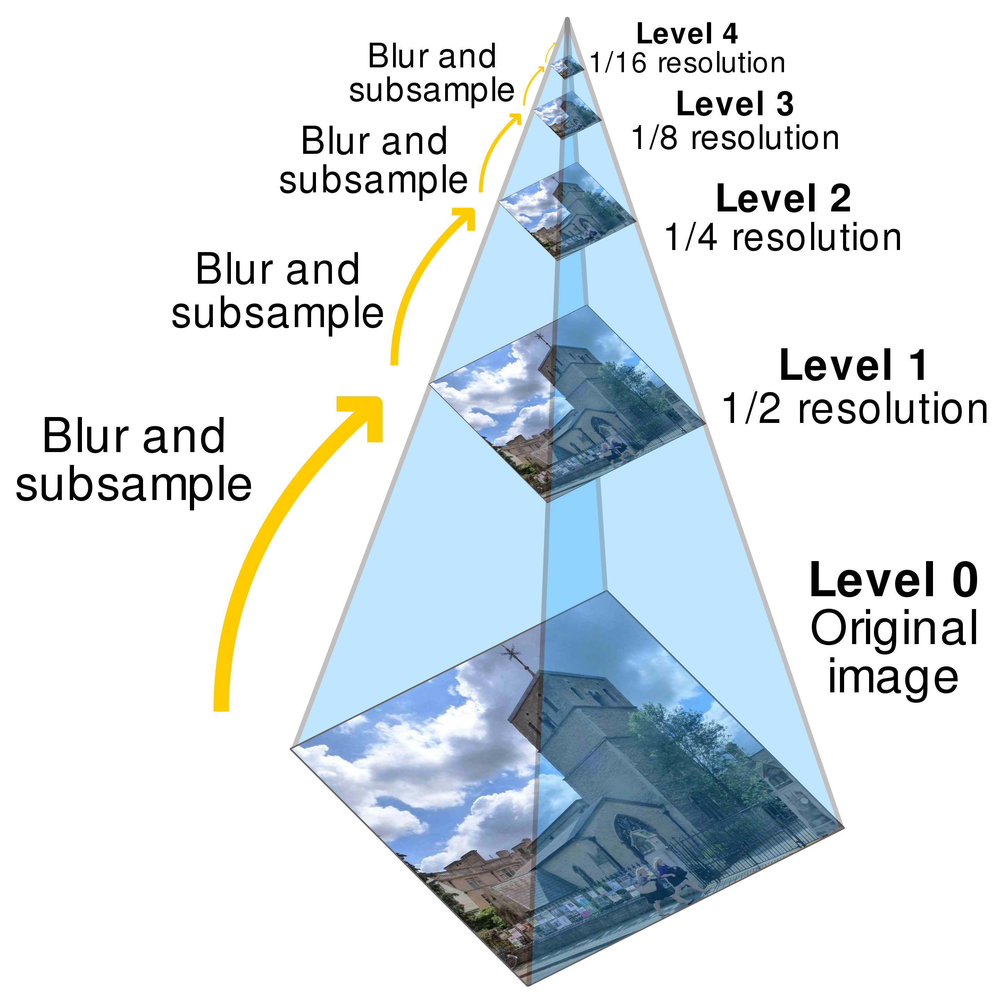
그림 출처 : https://en.wikipedia.org/wiki/Pyramid_%28image_processing%29#/media/File:Image_pyramid.svg

- Subsampling ( 부표본 =>  Pooling layer에서 사용)
  - 입력 데이터의 크기를 축소시켜 데이터량 감소
  


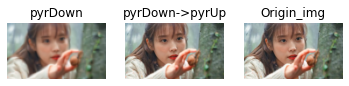

In [42]:
# downsample image by halving both width and height
# input:(h, w) --> output:(h/2, w/2)
lower_resolution_img = cv2.pyrDown(flower)
lower_resolution_img = cv2.pyrDown(lower_resolution_img)

# Upsamples image by doubling both width and height
# input:(h, w) --> output:(h*2, w*2)

higher_resolution_img = cv2.pyrUp(flower)
def plot_img(input_image, output_image, img):
    """
    Converts an image from BGR to RGB and plots
    """
    # change color channels order for matplotlib
    fig, ax = plt.subplots(nrows=1, ncols=3)
    ax[0].imshow(cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB))
    ax[0].set_title('pyrDown')
    ax[0].axis('off')

    ax[1].imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
    ax[1].set_title('pyrDown->pyrUp')
    ax[1].axis('off')

    ax[2].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[2].set_title('Origin_img')
    ax[2].axis('off')
    
flower = cv2.imread('data_new/IU.jpg')

plot_img(lower_resolution_img, higher_resolution_img,flower)

### 3챕터 요약
- 이번 장에서는 다양한 조작을 적용하여 초기 이미지 분석을 시작했다. 우리는 점 필터와 논의를 시작했고 비선형 필터뿐만 아니라 더 복잡한 선형 필터로 확장했다. 커널 크기 등과 같은 다양한 매개 변수에 대한 결과의 시각화를 보았다. 히스토그램 평준화와 같은 비선형 필터는 선형 필터로 수행하기 어려운 영상을 추가로 조정할 수 있습니다. 이 장에 소개된 이미지 그레이디언트는 객체 감지, 이미지 분할 등의 복잡한 작업에서 매우 흔하다. 또한 매개 변수를 다르게 선택할 수 있는 출력을 시각화하여 변환, 회전 및 아핀 변환과 같은 다양한 변환 방법을 보았다.


- 다양한 변환이 계단식 방식으로 적용되어 결합된 변환 결과를 생성할 수 있습니다. 마지막으로, 각각 계산을 더 빠르게 하거나 더 풍부한 정보를 추출하는 데 중요한 역할을 하는 이미지 다운샘플링 및 업샘플링 방법이 도입된다. 다음 챕터에서는 각각에 대한 중요성과 함께 다양한 기능과 특징 추출 방법을 살펴보겠습니다.

# 4챕터
- 이미지를 필터링하고 변환을 하는 것은 이미지를 부석하는 데는 좋지만 대부분의 컴퓨터 비전 작업에서는 충분치 않다.
- 사람은 오렌지와 사과를 직관적으로 구분할 수 있지만, 필터링효과만 있는 컴퓨터는 불가능하다.
- 인간의 지각이 질감, 색감, 표면, 모양, 반사 등 여러 가지 특징을 결합하여 하나의 물체를 다른 물체와 구별하기 때문
- Harris Corner Detector, FAST Keypoint Detector, ORB 기능 Detector와 같은 다양한 유형의 기능 추출기를 사용할 것
- 각 키포인트를 사용한 시각화도 개방형 CV를 사용하여 설명
- ORB 기능의 효과는 두 개의 유사한 응용 프로그램과 함께 표시
- 블랙박스 기능에 대한 간단한 토론

### Features use cases 

- 두 개의 이미지가 있으며 이러한 이미지가 서로 일치하는지 여부를 정량화하려고 합니다. 비교 메트릭을 가정하면 비교 메트릭 값이 임계값보다 클 때 이미지가 일치한다고 말합니다.
- 또 다른 예에서는 이미지의 대규모 데이터베이스가 있으며, 새로운 이미지의 경우 일치와 유사한 작업을 수행하려고 합니다. 모든 이미지에 대해 모든 것을 다시 계산하는 대신, 우리는 더 작고, 더 쉽게 검색할 수 있고, 이미지의 표현과 일치할 만큼 충분히 견고하게 저장할 수 있다. 이것은 종종 이미지의 형상 벡터라고 불린다. 새 이미지가 나타나면 새 이미지에 대해 유사한 표현을 추출하고 이전에 생성된 데이터베이스 중 가장 가까운 일치 항목을 검색한다. 이 표현은 보통 형상의 관점에서 공식화된다.
- 또한, 물체를 찾는 경우, 우리는 객체나 영역에 대한 작은 이미지를 가지고 있다. 목표는 이미지에 이 템플릿이 있는지 확인하는 것입니다. 지정된 샘플 이미지에 대해 템플릿의 키 포인트를 일치시켜야 합니다. 일치 값이 임계값보다 크면 샘플 이미지에 지정된 템플릿과 유사한 영역이 있다고 말할 수 있습니다. 소견을 더욱 개선하기 위해 샘플 이미지에서 템플릿 이미지가 있는 위치를 표시할 수도 있습니다.
- 이미지에서 이미지 일치 또는 객체 탐지를 수행하기 위한 소프트웨어를 설계할 때, 검출을 위한 기본 파이프라인이 기계 학습 관점에서 공식화된다. 이것은 우리가 이미지 세트를 가져가고, 중요한 정보를 추출하고, 우리의 모델을 학습하고, 유사한 물체를 감지하기 위해 새로운 이미지에 학습된 모델을 사용한다는 것을 의미한다.
  - 첫 번째 단계는 주어진 이미지에서 강력한 기능을 추출하는 것이다. 여기에는 전체 이미지에서 가능한 기능을 검색하고 임계값을 지정하는 작업이 포함됩니다. SHIF, SOF, FAST, BRIF, ORB 검출기 등과 같은 기능의 선택을 위한 몇 가지 기법이 있다. 추출된 형상은 경우에 따라 모델에 의해 학습되거나 재읽기 위해 저장될 수 있도록 좀 더 설명적인 형태로 변환되어야 한다.
  - 형상 일치의 경우 샘플 이미지가 제공되고 기준 이미지와 일치하는지 확인하려고 한다. 앞에서 설명한 것처럼 형상 검출 및 추출 후 거리 메트릭이 형성되어 기준 형상에 관한 표본의 형상 간 거리를 계산한다. 이 거리가 임계값보다 작으면 두 영상이 유사하다고 말할 수 있습니다.
  - 형상 추적의 경우 앞에서 설명한 형상 일치 단계를 생략한다. 전역적으로 일치하는 기능보다는 인접 항목 일치에 더 초점을 맞춥니다. 이 기능은 이미지 안정화, 객체 추적 또는 동작 감지와 같은 경우에 사용됩니다.
  
- 픽셀을 이용한 컴퓨터 비전 시스템은 두 이미지의 픽셀 값 사이의 평균 제곱 거리를 사용합니다. 그러나, 이미지가 거의 동일하지 않기 때문에, 효과가 좋지 않다. 그래서 로컬(이미지 주변 이미지의 통계를 고려) 및 글로벌 속성(전체 이미지 통계를 고려)을 고려하는 종류의 기능을 사용한다. 로컬 및 글로벌 속성은 모두 이미지에 대한 중요한 정보를 제공. 이를 캡쳐할 수 있는 컴퓨팅 기능은 애플리케이션에서 보다 강력하고 정확한 기능을 제공한다.

- 형상 검출기의 가장 기본적인 형태는 점 형상이다. 스마트폰의 파노라마 생성과 같은 응용 프로그램에서 각 이미지는 해당하는 이전 이미지와 연결됩니다. 이 이미지 연결에는 픽셀 수준의 정확도로 중첩된 이미지의 정확한 방향이 필요합니다. 두 영상 사이에 해당하는 픽셀을 계산하려면 픽셀 일치가 필요



  - 두 개의 이미지가 있을 때, 이 이미지가 서로 일치하는 지 여부를 수치화(또는 정량화) 하고자 한다. 예로, 비교 메트릭 값이 임계값 보다 클 때, 이미지가 일치한다고 할 수 있다.
  - 이미지

### Harris Corner Detection
- Harris Corner Detection 기술을 사용하여 피쳐 포인트 감지를 시작한다. 여기서, 우리는 이미지 크기에 비해 크기가 작은 창이라는 매트릭스를 선택하는 것으로 시작
- 평면이 있으면 창문의 이동 방향에 관계없이 창 영역의 변화를 볼 수 없습니다. 창 영역에 가장자리나 모서리가 없기 때문입니다.
- 두 번째 경우, 윈도우가 이미지의 가장자리에 중첩되어 이동됩니다. 창이 가장자리 방향을 따라 움직이면 창의 변경 내용을 볼 수 없습니다. 창이 다른 방향으로 이동하면 창 영역의 변화를 쉽게 관찰할 수 있습니다.
- 마지막으로, 윈도우가 영상의 한 모서리에 중첩되어 있고 모서리가 두 모서리의 교차점인 이동된 경우, 대부분의 경우 윈도우 영역의 변화를 관찰할 수 있습니다.
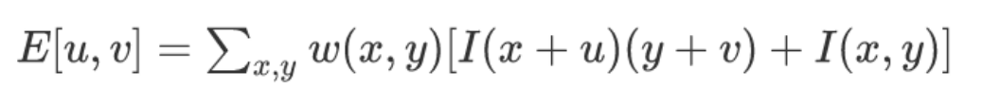

- 즉, 코너점에서는 모든 방향으로 상당한 변화량이 있기 때문에, 이를 감지하여 검출하는 방법.
- 영상을 추적하거나 인식할 때, 영상과 영상을 매칭할 때 특징점을 뽑아 매칭하는데 그러한 특징점을 찾기 위함.
- 코너란 미분값(픽셀값의 변화량)이 서로 직교하는 방향에서 동시에 나타난다면 이점은 매우 독특한 점이며, 이와 같이 직교하는 방향으로 미분값이 크게 나타나는 점을 코너라고 한다.
- 코너 포인트는 특정 사물과 다른 사물 또는 배경 사이에 존재

- w는 창이고, u와 v는 shift이고 I는 image pixel value. 출력 E는 목표 함수이며, u 및 v에 대해 이를 최대화하면 이미지 I의 코너 픽셀이 됩니다.

- 참조 : https://blog.naver.com/xmx333/220055226227. https://blog.naver.com/tal_gami/222055843580

  - dst = cv2.cornerHarris(src, blockSize, kernel_size, k, dst, borderType)
  - parameters
    - src: 입력 이미지, 그레이 스케일
    - blockSize: 이웃 픽셀 범위
    - ksize: 소벨 미분 필터 크기
    - k(optional): 코너 검출 상수 (보통 0.04~0.06)
    - dst(optional): 코너 검출 결과 (src와 같은 크기의 1 채널 배열, 변화량의 값, 지역 최대 값이 코너점을 의미)
    - borderType(optional): 외곽 영역 보정 형식

(-0.5, 729.5, 729.5, -0.5)

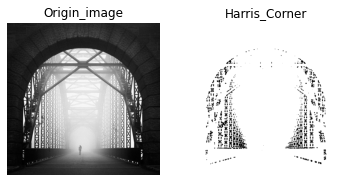

In [43]:
# load image and convert to grayscale
img = cv2.imread('data_new/blackphoto.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# harris corner parameters
block_size = 4 # Covariance matrix size
kernel_size = 3 # neighbourhood kernel
k = 0.01# parameter for harris corner score # k값이 커질 수록, 그림이 덜 선명하게 구분된다. 코너 간 간격이 커지는 듯 하다. 예로, 아래의 그림 철근의 내부 내용이 희미해진다.
# compute harris corner
corners = cv2.cornerHarris(gray, block_size, kernel_size, k)
# create corner image
display_corner = np.ones(gray.shape[:2])
display_corner = 255*display_corner
# apply thresholding to the corner score
thres = 0.01 # more than 1% of max value
display_corner[corners>thres*corners.max()] = 10 #display pixel value
# set up display

fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(img, cmap='gray')
ax[0].set_title('Origin_image')
ax[0].axis('off')

ax[1].imshow(display_corner, cmap='gray')
ax[1].set_title('Harris_Corner')
ax[1].axis('off')



- k가 0.22일 때 그림
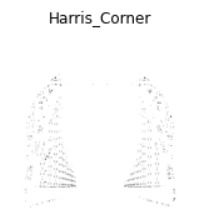

- k가 0.15일 때 그림
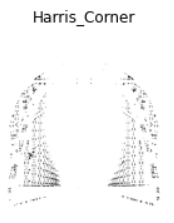

- k가 0.1일 때 그림
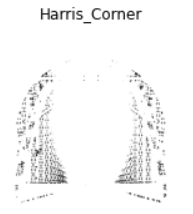

- k가 0.01 일 때 그림
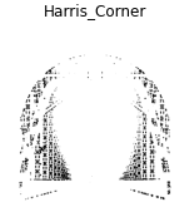


(-0.5, 532.5, 299.5, -0.5)

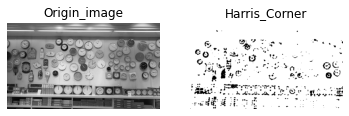

In [44]:
# load image and convert to grayscale
img = cv2.imread('data_new/clocks.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# harris corner parameters
block_size = 4 # Covariance matrix size
kernel_size = 3 # neighbourhood kernel
k = 0.01 # parameter for harris corner score
# compute harris corner
corners = cv2.cornerHarris(gray, block_size, kernel_size, k)
# create corner image
display_corner = np.ones(gray.shape[:2])
display_corner = 255*display_corner
# apply thresholding to the corner score
thres = 0.01 # more than 1% of max value
display_corner[corners>thres*corners.max()] = 10 #display pixel value
# set up display

fig, ax = plt.subplots(nrows=1, ncols=2)

ax[0].imshow(gray, cmap='gray')
ax[0].set_title('Origin_image')
ax[0].axis('off')

ax[1].imshow(display_corner, cmap='gray')
ax[1].set_title('Harris_Corner')
ax[1].axis('off')


(-0.5, 135.5, 101.5, -0.5)

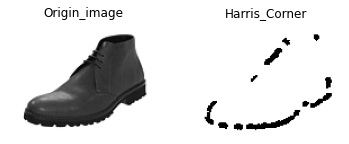

In [125]:
# load image and convert to grayscale
img = cv2.imread('data_new/boots.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# harris corner parameters
block_size = 4 # Covariance matrix size
kernel_size = 3 # neighbourhood kernel
k = 0.01 # parameter for harris corner score
# compute harris corner
corners = cv2.cornerHarris(gray, block_size, kernel_size, k)
# create corner image
display_corner = np.ones(gray.shape[:2])
display_corner = 255*display_corner
# apply thresholding to the corner score
thres = 0.01 # more than 1% of max value
display_corner[corners>thres*corners.max()] = 10#display pixel value
# set up display

fig, ax = plt.subplots(nrows=1, ncols=2)

ax[0].imshow(gray, cmap='gray')
ax[0].set_title('Origin_image')
ax[0].axis('off')

ax[1].imshow(display_corner, cmap='gray')
ax[1].set_title('Harris_Corner')
ax[1].axis('off')

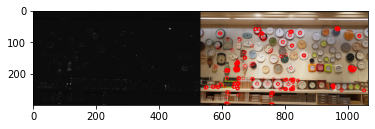

In [64]:
import cv2
import numpy as np

img = cv2.imread('data_new/clocks.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 해리스 코너 검출 ---①

block_size = 4 # 이웃 픽셀 범위
kernel_size = 3 # 소벨 미분 필터 크기
k = 0.01 # 코너 검출 상수
corner = cv2.cornerHarris(gray, block_size, kernel_size, k)

# 변화량 결과의 최대값 10% 이상의 좌표 구하기 ---②
coord = np.where(corner > 0.1* corner.max())
coord = np.stack((coord[1], coord[0]), axis=-1)

# 코너 좌표에 동그리미 그리기 ---③
for x, y in coord:
    cv2.circle(img, (x,y), 5, (0,0,255), 1, cv2.LINE_AA)

# 변화량을 영상으로 표현하기 위해서 0~255로 정규화 ---④
corner_norm = cv2.normalize(corner, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
# 화면에 출력
corner_norm = cv2.cvtColor(corner_norm, cv2.COLOR_GRAY2BGR)
merged = np.hstack((corner_norm, img)) # np.hstack(img1, img2) : 이미지 합치기. 수평 병합
plt.imshow(cv2.cvtColor(merged,cv2.COLOR_BGR2RGB))

## 시-토마시 검출 (Shi & Tomasi Detection)
  - 해리스 코너 검출을 좀더 개선한 알고리즘.

  - corners = cv2.goodFeaturesToTrack(img, maxCorners, qualityLevel, minDistance, corners, mask, blockSize, useHarrisDetector, k)
  - parameters
    - img: 입력 이미지
    - maxCorners: 얻고 싶은 코너의 개수, 강한 것 순으로
    - qualityLevel: 코너로 판단할 스레시홀드 값
    - minDistance: 코너 간 최소 거리
    - mask(optional): 검출에 제외할 마스크
    - blockSize(optional)=3: 코너 주변 영역의 크기
    - useHarrisDetector(optional)=False: 코너 검출 방법 선택 (True: 해리스 코너 검출 방법, False: 시와 토마시 코너 검출 방법)
    - k(optional): 해리스 코너 검출 방법에 사용할 k 계수
    - corners: 코너 검출 좌표 결과, N x 1 x 2 크기의 배열, 실수 값이므로 정수로 변형 필요

    useHarrisDetector 파라미터에 True를 전달하면 해리스 코너 검출을 하고, 디폴트 값인 False를 전달하면 시와 토마시 코너 검출을 합니다

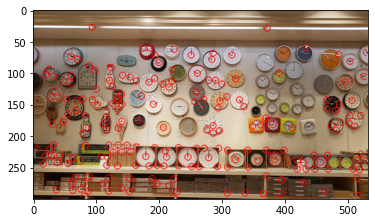

In [173]:
import cv2
import numpy as np

img = cv2.imread('data_new/clocks.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 시-토마스의 코너 검출 메서드
corners = cv2.goodFeaturesToTrack(gray, 200, 0.01, 10) #maxCorners, qualityLevel, minDistance 
# 실수 좌표를 정수 좌표로 변환
corners = np.int32(corners)

# 좌표에 동그라미 표시
for corner in corners:
    x, y = corner[0]
    cv2.circle(img, (x, y), 5, (0,0,255), 1, cv2.LINE_AA)

plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

In [181]:
corners

array([[[434,  59]],

       [[118, 233]],

       [[420, 238]],

       [[120, 214]],

       [[108, 232]],

       [[290, 111]],

       [[ 81, 295]],

       [[116, 169]],

       [[117, 189]],

       [[117, 246]],

       [[328, 142]],

       [[316,  71]],

       [[295, 219]],

       [[482, 190]],

       [[284,  78]],

       [[474, 183]],

       [[ 55, 243]],

       [[ 84, 186]],

       [[223, 298]],

       [[224, 268]],

       [[140, 133]],

       [[309, 222]],

       [[257, 145]],

       [[504,  81]],

       [[ 16, 244]],

       [[448, 252]],

       [[519, 253]],

       [[ 38, 242]],

       [[174,  60]],

       [[381, 181]],

       [[124,  91]],

       [[489, 178]],

       [[163, 246]],

       [[ 63, 286]],

       [[430, 242]],

       [[ 42, 231]],

       [[141, 176]],

       [[164, 217]],

       [[ 29, 231]],

       [[507, 143]],

       [[ 32, 213]],

       [[120, 266]],

       [[135, 214]],

       [[120, 287]],

       [[261, 100]],

       [[1

In [66]:
import cv2
import numpy as np

img = cv2.imread('data_new/clocks.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 시-토마스의 코너 검출 메서드
corners = cv2.goodFeaturesToTrack(gray, 200, 0.01, 10) #maxCorners, qualityLevel, minDistance 
# 실수 좌표를 정수 좌표로 변환
corners = np.int32(corners)

plt.imshow(cv2.cvtColor(corners,cv2.COLOR_BGR2RGB))

error: C:\ci\opencv_1512688052760\work\modules\imgproc\src\color.cpp:11010: error: (-215) depth == 0 || depth == 2 || depth == 5 in function cv::cvtColor


### 위 그림에서와 같이 연속되지 않는 특징을 찾음으로써 객체를 분류할 수 있다.

# FAST Feature
- 실시간 응용 프로그램에서는 지연이 발생하면 기능이 저하되거나 시스템 오류가 발생할 수 있다. 때문에 Fast from Accelerated Segment test가 도입되었다. 
- 알고리즘은 픽셀 인접성을 사용하여 이미지의 주요 포인트를 계산한다.
- FAST의 기능은 다음과 같다.
  - 우선 강도 I 를 정하기 위해 관심 지점 후보 픽셀(i,j) 하나를 정한다.
  - 그리고 임계값 t가 주어진다면, 픽셀 (i,j)보다 밝거나 더 어두운 인접 포인트를 임계값 t로 추정한다.
  - 이 값은 (I(i,j), +t)보다 작거나 (I(i,j), -t)보다 큰 n픽셀 여러개를 출력한다.
  - 그러면 이러한 픽셀의 강도 값으로 중앙 픽셀 p가 모서리인지 여부를 결정한다.
  -  (I(i,j) + t)보다 크거나 (I(i,j) - t)보다 작으면 중심 픽셀이 모서리로 간주됩니다
  
  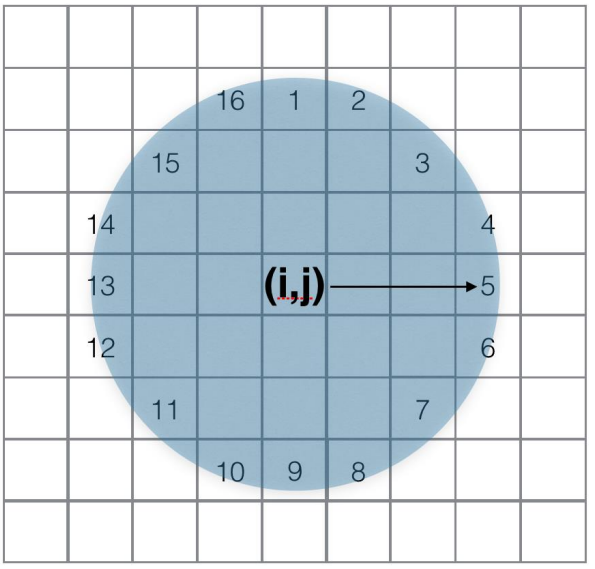
  
- OpenCV() : 
    1. cv2를 사용하여 디텍터를 초기화합니다.FastFeatureDetector_create()
    2. 필터링 탐지에 대한 임계값 매개 변수 설정
    3. 반복 검출된 인근 지역을 제거하는 데 사용할 비최소 억제일 경우 플래그 설정
    4. 키포인트를 감지하여 입력 영상에 표시합니다
    
    
- 이미지에 따라 다른 임계값을 선택하면 다음과 같은 주요 기능 포인트의 수가 다르게 생성됩니다.

In [47]:
def compute_fast_det(filename, is_nms=True, thresh =10): # thresh는 임계 값(t),
 """
 Reads image from filename and computes FAST keypoints.
 Returns image with keypoints
 filename: input filename
 is_nms: flag to use Non-maximal suppression
 thresh: Thresholding value
 """
    img = cv2.imread(filename)

    # Initiate FAST object with default values # 디텍터 초기화
    fast = cv2.FastFeatureDetector_create() 
    # find and draw the keypoints 
    if not is_nms:
        fast.setNonmaxSuppression(0)
    fast.setThreshold(thresh) #임계값 적용
    kp = fast.detect(img,None) # 검출 
    cv2.drawKeypoints(img, kp, img, color=(255,0,0)) #키 포인트 그리기
"""cv2.drawKeypoints(img, keypoints, outImg, color, flags)
img: 입력 이미지
keypoints: 표시할 특징점 리스트
outImg: 특징점이 그려진 결과 이미지
color(optional): 표시할 색상 (default: 랜덤)
flags(optional): 표시 방법 (cv2.DRAW_MATCHES_FLAGS_DEFAULT: 좌표 중심에 동그라미만 그림(default), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS: 동그라미의 크기를 size와 angle을 반영해서 그림)
""" 
    return img


(-0.5, 339.5, 190.5, -0.5)

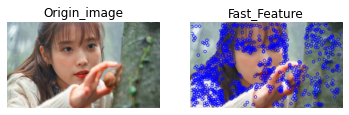

In [48]:
img = cv2.imread('data_new/IU.jpg')
compute_flower = compute_fast_det('data_new/IU.jpg')
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[0].set_title('Origin_image')
ax[0].axis('off')

ax[1].imshow(cv2.cvtColor(compute_flower, cv2.COLOR_BGR2RGB))
ax[1].set_title('Fast_Feature')
ax[1].axis('off')

In [171]:
def compute_fast_det(filename, is_nms=True, thresh =3): # thresh는 임계 값(t),
    img = cv2.imread(filename)

    # Initiate FAST object with default values # 디텍터 초기화
    fast = cv2.FastFeatureDetector_create() 
    # find and draw the keypoints 
    if not is_nms:
        fast.setNonmaxSuppression(0)
    fast.setThreshold(thresh) #임계값 적용
    kp = fast.detect(img,None) # 검출 
    cv2.drawKeypoints(img, kp, img, color=(255,0,0)) #키 포인트 그리기

    return img

(-0.5, 339.5, 190.5, -0.5)

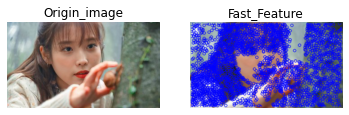

In [172]:
img = cv2.imread('data_new/IU.jpg')
compute_flower = compute_fast_det('data_new/IU.jpg')
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[0].set_title('Origin_image')
ax[0].axis('off')

ax[1].imshow(cv2.cvtColor(compute_flower, cv2.COLOR_BGR2RGB))
ax[1].set_title('Fast_Feature')
ax[1].axis('off')

## 이미지 비교를 통해, 주변 이미지들보다 상대적으로 밝거나, 어두운 부분을 모서리로 인식하고, 추출해냄을 알 수 있다. 

(-0.5, 339.5, 190.5, -0.5)

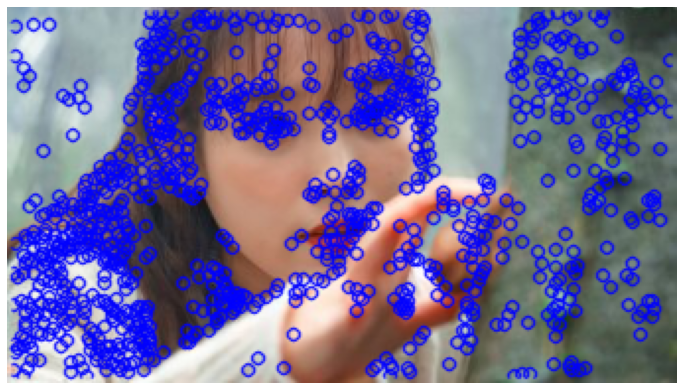

In [49]:
plt.figure(figsize=(12,8))
plt.imshow(cv2.cvtColor(compute_flower, cv2.COLOR_BGR2RGB))
plt.axis('off')

- 이것은 매개 변수의 선택이 다른 이미지에 매우 중요하다는 것을 보여준다. 일부 이미지에 대해 공통 임계값은 작동하지 않을 수 있지만 이미지의 유사성에 따라 근사치를 사용할 수 있습니다.

## SimpleBlobDetector 
  - BLOB(Binary Large Object) 는 이진 스케일로 연결된 픽셀 그룹을 이야기 한다.
  - 자잘한 객체는 노이즈로 여기고, 특정 크기 이상의 큰 객체만 찾아내는 검출기.

  - detector = cv2.SimpleBlobDetector_create([parameters]) # BLOB 검출기 생성자
  - prameters
      - minThreshold, maxThreshold, thresholdStep: BLOB를 생성하기 위한 경계 값
      - (minThreshold에서 maxThreshold를 넘지 않을 때까지 thresholdStep만큼 증가)
      - minRepeatability: BLOB에 참여하기 위한 연속된 경계 값의 개수
      - minDistBetweenBlobs: 두 BLOB을 하나의 BLOB으로 간주하는 거리
      - filterByArea: 면적 필터 옵션
      - minArea, maxArea: min~max 범위의 면적만 BLOB으로 검출
      - filterByCircularity: 원형 비율 필터 옵션
      - minCircularity, maxCircularity: min~max 범위의 원형 비율만 BLOB으로 검출
      - filterByColor: 밝기를 이용한 필터 옵션
      - blobColor: 0 = 검은색 BLOB 검출, 255 = 흰색 BLOB 검출
      - filterByConvexity: 볼록 비율 필터 옵션
      - minConvexity, maxConvexity: min~max 범위의 볼록 비율만 BLOB으로 검출
      - filterByInertia: 관성 비율 필터 옵션
      - minInertiaRatio, maxInertiaRatio: min~max 범위의 관성 비율만 BLOB으로 검출

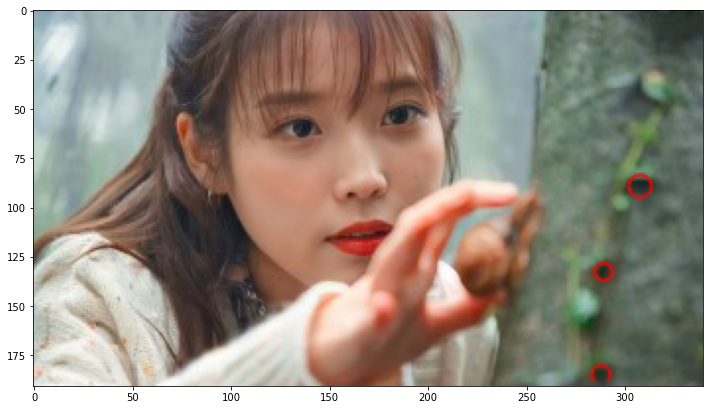

In [50]:
# SimpleBolbDetector 검출기 (kpt_blob.py)

import cv2
import numpy as np
 
img = cv2.imread('data_new/IU.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# SimpleBlobDetector 생성 ---①
detector = cv2.SimpleBlobDetector_create()
# 키 포인트 검출 ---②
keypoints = detector.detect(gray)
# 키 포인트를 빨간색으로 표시 ---③
img = cv2.drawKeypoints(img, keypoints, None, (0,0,255),\
                flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
 
    
plt.figure(figsize=(12,8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

### 이전과 달리, SimpleBlobDetector에서는 자잘한 코너는 노이즈로 가정하고 특정 크기 이상의 객체만 검출함

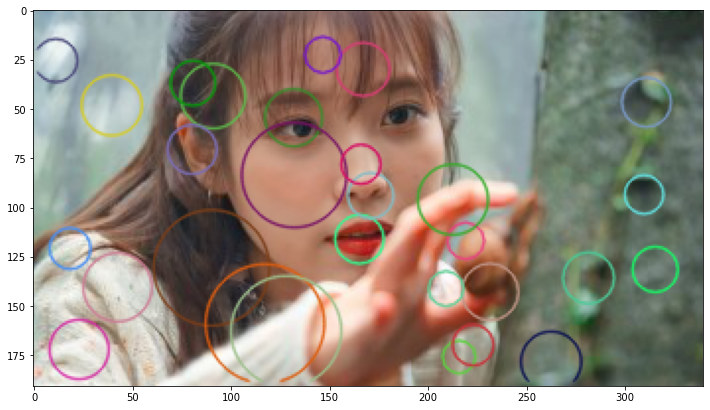

In [51]:
import cv2
import numpy as np
 
img = cv2.imread('data_new/IU.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# blob 검출 필터 파라미터 생성 ---①
params = cv2.SimpleBlobDetector_Params()

# 경계값 조정 ---②
params.minThreshold = 10
params.maxThreshold = 300
params.thresholdStep = 5
# 면적 필터 켜고 최소 값 지정 ---③
params.filterByArea = True
params.minArea = 200
  
# 컬러, 볼록 비율, 원형비율 필터 옵션 끄기 ---④
params.filterByColor = False
params.filterByConvexity = False
params.filterByInertia = False
params.filterByCircularity = False 

# 필터 파라미터로 blob 검출기 생성 ---⑤
detector = cv2.SimpleBlobDetector_create(params)
# 키 포인트 검출 ---⑥
keypoints = detector.detect(gray)
# 키 포인트 그리기 ---⑦
img_draw = cv2.drawKeypoints(img, keypoints, None, None,\
                     cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# 결과 출력 ---⑧

plt.figure(figsize=(12,8))
plt.imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))

(-0.5, 339.5, 190.5, -0.5)

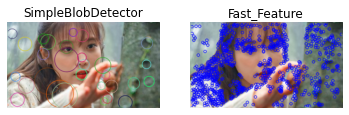

In [52]:
# FastFeature과 비교해보자

img = cv2.imread('data_new/IU.jpg')
compute_flower = compute_fast_det('data_new/IU.jpg')
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))
ax[0].set_title('SimpleBlobDetector')
ax[0].axis('off')

ax[1].imshow(cv2.cvtColor(compute_flower, cv2.COLOR_BGR2RGB))
ax[1].set_title('Fast_Feature')
ax[1].axis('off')

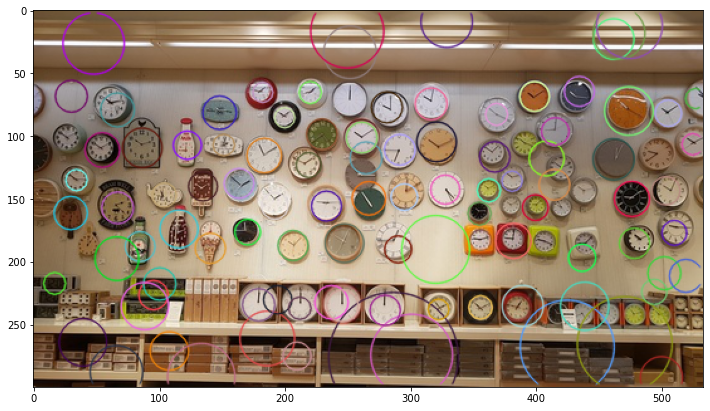

In [53]:
# FastFeature과 비교해보자
import cv2
import numpy as np
 
img = cv2.imread('data_new/clocks.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# blob 검출 필터 파라미터 생성 ---①
params = cv2.SimpleBlobDetector_Params()

# 경계값 조정 ---②
params.minThreshold = 5
params.maxThreshold = 1000
params.thresholdStep = 5
# 면적 필터 켜고 최소 값 지정 ---③
params.filterByArea = True
params.minArea = 200
  
# 컬러, 볼록 비율, 원형비율 필터 옵션 끄기 ---④
params.filterByColor = False
params.filterByConvexity = False
params.filterByInertia = False
params.filterByCircularity = False 

# 필터 파라미터로 blob 검출기 생성 ---⑤
detector = cv2.SimpleBlobDetector_create(params)
# 키 포인트 검출 ---⑥
keypoints = detector.detect(gray)
# 키 포인트 그리기 ---⑦
img_draw = cv2.drawKeypoints(img, keypoints, None, None,\
                     cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# 결과 출력 ---⑧
plt.figure(figsize=(12,8))
plt.imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))

(-0.5, 532.5, 299.5, -0.5)

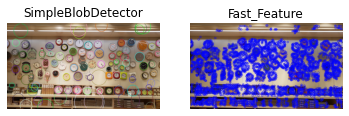

In [54]:
# FastFeature과 비교해보자
import cv2
import numpy as np
 
img = cv2.imread('data_new/clocks.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# blob 검출 필터 파라미터 생성 ---①
params = cv2.SimpleBlobDetector_Params()

# 경계값 조정 ---②
params.minThreshold = 10
params.maxThreshold = 300
params.thresholdStep = 5
# 면적 필터 켜고 최소 값 지정 ---③
params.filterByArea = True
params.minArea = 200
  
# 컬러, 볼록 비율, 원형비율 필터 옵션 끄기 ---④
params.filterByColor = False
params.filterByConvexity = False
params.filterByInertia = False
params.filterByCircularity = False 

# 필터 파라미터로 blob 검출기 생성 ---⑤
detector = cv2.SimpleBlobDetector_create(params)
# 키 포인트 검출 ---⑥
keypoints = detector.detect(gray)
# 키 포인트 그리기 ---⑦
img_draw = cv2.drawKeypoints(img, keypoints, None, None,\
                     cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# 결과 출력 ---⑧

img = cv2.imread('data_new/clocks.jpg')
compute_flower = compute_fast_det('data_new/clocks.jpg')
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))
ax[0].set_title('SimpleBlobDetector')
ax[0].axis('off')

ax[1].imshow(cv2.cvtColor(compute_flower, cv2.COLOR_BGR2RGB))
ax[1].set_title('Fast_Feature')
ax[1].axis('off')

(-0.5, 135.5, 101.5, -0.5)

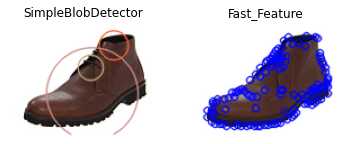

In [68]:
# FastFeature과 비교해보자
import cv2
import numpy as np
 
img = cv2.imread('data_new/boots.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# blob 검출 필터 파라미터 생성 ---①
params = cv2.SimpleBlobDetector_Params()

# 경계값 조정 ---②
params.minThreshold = 10
params.maxThreshold = 300
params.thresholdStep = 5
# 면적 필터 켜고 최소 값 지정 ---③
params.filterByArea = True
params.minArea = 200
  
# 컬러, 볼록 비율, 원형비율 필터 옵션 끄기 ---④
params.filterByColor = False
params.filterByConvexity = False
params.filterByInertia = False
params.filterByCircularity = False 

# 필터 파라미터로 blob 검출기 생성 ---⑤
detector = cv2.SimpleBlobDetector_create(params)
# 키 포인트 검출 ---⑥
keypoints = detector.detect(gray)
# 키 포인트 그리기 ---⑦
img_draw = cv2.drawKeypoints(img, keypoints, None, None,\
                     cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# 결과 출력 ---⑧

img = cv2.imread('data_new/boots.jpg')
compute_flower = compute_fast_det('data_new/boots.jpg')
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))
ax[0].set_title('SimpleBlobDetector')
ax[0].axis('off')

ax[1].imshow(cv2.cvtColor(compute_flower, cv2.COLOR_BGR2RGB))
ax[1].set_title('Fast_Feature')
ax[1].axis('off')

In [ ]:
def compute_fast_det(filename, is_nms=True, thresh =10): # thresh는 임계 값(t),
 """
 Reads image from filename and computes FAST keypoints.
 Returns image with keypoints
 filename: input filename
 is_nms: flag to use Non-maximal suppression
 thresh: Thresholding value
 """
    img = cv2.imread(filename)

    # Initiate FAST object with default values # 디텍터 초기화
    fast = cv2.FastFeatureDetector_create() 
    # find and draw the keypoints 
    if not is_nms:
        fast.setNonmaxSuppression(0)
    fast.setThreshold(thresh) #임계값 적용
    kp = fast.detect(img,None) # 검출 
    cv2.drawKeypoints(img, kp, img, color=(255,0,0)) #키 포인트 그리기
"""cv2.drawKeypoints(img, keypoints, outImg, color, flags)
img: 입력 이미지
keypoints: 표시할 특징점 리스트
outImg: 특징점이 그려진 결과 이미지
color(optional): 표시할 색상 (default: 랜덤)
flags(optional): 표시 방법 (cv2.DRAW_MATCHES_FLAGS_DEFAULT: 좌표 중심에 동그라미만 그림(default), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS: 동그라미의 크기를 size와 angle을 반영해서 그림)
""" 
    return img

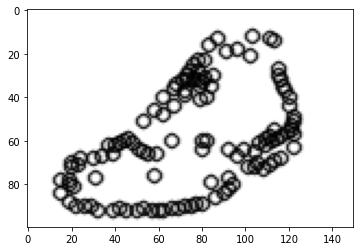

In [147]:
img = cv2.imread('data_new/boots.jpg')
back = cv2.imread('data_new/white_face.jpg')
back = back[:100,:150]
fast = cv2.FastFeatureDetector_create() 
# find and draw the keypoints 
fast.setThreshold(10) #임계값 적용
kp = fast.detect(img,None) # 검출 
outimg = cv2.drawKeypoints(back, kp, back, color=(0,0,0))
plt.imshow(outimg)

In [151]:
for i,feature in enumerate(kp):
        array = np.zeros(100,150)
        x=int(feature.pt[0])
        y=int(feature.pt[1])
        array[x][y] = 1

TypeError: Cannot interpret '150' as a data type

In [161]:
array = np.zeros((100,150))
print(array)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


## Canny Edge 감지

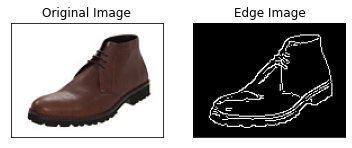

In [146]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('data_new/boots.jpg')
edges = cv2.Canny(img,50,120)

plt.subplot(121),plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
 
plt.show()

In [130]:
len(back[:100])

100

## ORB features (Orientated FAST and Rotated BRIEF)
- 코너 검출기를 사용하면 계산이 빠르지만 두 개의 이미지를 일치시킬 때 해당 픽셀에 대해 일치하는 두 개의 이미지 모서리를 선택하기가 어렵다
- ORB 기능은 모서리와 같은 탐지된 키포인트 및 대응 설명자의 조합을 통해 이미지를 보다 효율적이고 강력하게 비교할 수 있습니다
- ORB 기능 검출 기능은 FAST Feature은 디텍터와 방향 구성 요소 및 BRIEF Descriptors라는 두 가지 알고리즘이 결합
- 강력한 탐지를 유지하면서 탐지 속도를 높일 수 있습니다
- ORB에서 FAST 기능은 방향 정보와 함께 사용됩니다. 9픽셀의 원형 반지름을 사용하여 계산된 강도 중심과 모서리 중심 사이의 벡터는 지정된 모서리의 방향을 설명하는 데 사용됩니다

- 이미지 I 및 패치 창의 경우 다음을 사용하여 모멘트를 계산합니다.


 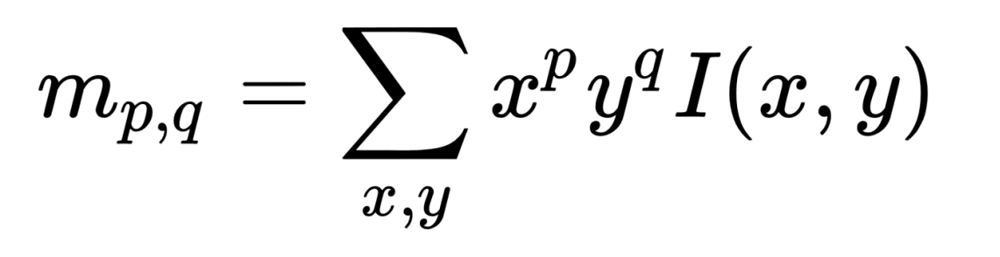
 
- 이전 순간을 사용하여 주어진 패치의 강도 중심은 다음과 같이 주어진다.


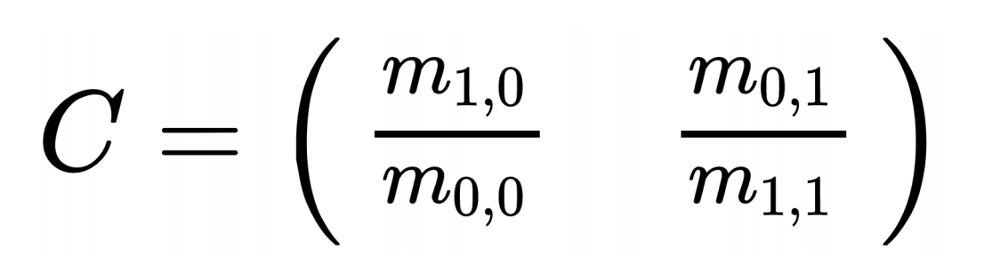





- ORB는 3단계 프로세스로 다음과 같이 설정된다.
  - ORB 객체 생성 및 파라미터 값 업데이트

In [182]:
orb = cv2.ORB_create()
# set parameters
orb.setScoreType(cv2.FAST_FEATURE_DETECTOR_TYPE_9_16)


  - 
    - 이전에 생성된 ORB 개체에서 키포인트 탐지
  


In [183]:
# detect keypoints
kp = orb.detect(img,None)

  - 
    - 마지막으로, 각 키포인트에 대한 계산 설명자 탐지


In [184]:
# for detected keypoints compute descriptors.
kp, des = orb.compute(img, kp)


- ORB 키포인트 탐지 및 설명자 추출기의 전체 코드는 다음과 같이 제공됩니다.


In [185]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
# With jupyter notebook uncomment below line
# %matplotlib inline
# This plots figures inside the notebook
def compute_orb_keypoints(filename):
     """
     Reads image from filename and computes ORB keypoints
     Returns image, keypoints and descriptors.
     """
     # load image
     img = cv2.imread(filename)

     # create orb object
     orb = cv2.ORB_create()

     # set parameters
     # FAST feature type #FAST feature 디텍터 타입 9_16을 가져온다. ==> 16개 중 9개 연속으로 되는 것. 5_8, 7_12, 9_16 등이 있다.
     # 참고 : https://docs.opencv.org/3.4/df/d74/classcv_1_1FastFeatureDetector.html
     orb.setScoreType(cv2.FAST_FEATURE_DETECTOR_TYPE_9_16)

     # detect keypoints
     kp = orb.detect(img,None)
     # for detected keypoints compute descriptors.
     kp, des = orb.compute(img, kp)
     return img, kp, des


In [186]:
compute = compute_orb_keypoints('data_new/IU.jpg')


In [187]:
compute

(array([[[179, 169, 145],
         [178, 168, 144],
         [178, 167, 140],
         ...,
         [ 44,  52,  41],
         [ 64,  72,  61],
         [ 92, 100,  89]],
 
        [[181, 171, 147],
         [180, 170, 146],
         [180, 169, 142],
         ...,
         [ 40,  48,  37],
         [ 49,  57,  46],
         [ 64,  72,  61]],
 
        [[182, 172, 148],
         [181, 172, 145],
         [182, 171, 144],
         ...,
         [ 39,  47,  36],
         [ 40,  48,  37],
         [ 45,  53,  42]],
 
        ...,
 
        [[220, 220, 220],
         [220, 220, 220],
         [228, 229, 227],
         ...,
         [ 61,  74,  66],
         [ 57,  70,  62],
         [ 55,  68,  60]],
 
        [[220, 222, 222],
         [224, 228, 223],
         [231, 236, 227],
         ...,
         [ 69,  79,  73],
         [ 64,  74,  68],
         [ 61,  71,  65]],
 
        [[218, 223, 226],
         [223, 230, 227],
         [232, 242, 230],
         ...,
         [ 74,  84,  78],
  

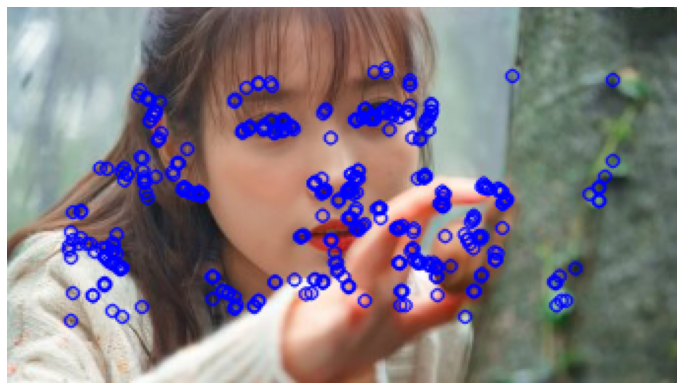

In [188]:
def draw_keyp(img, kp):
     """
     Takes image and keypoints and plots on the same images
     Does not display it.
     """
     cv2.drawKeypoints(img,kp,img, color=(255,0,0), flags=2)
     return img

    
def plot_img(img, figsize=(12,8)):
     """
     Plots image using matplotlib for the given figsize
     """
     fig = plt.figure(figsize=figsize)
     ax = fig.add_subplot(1,1,1)
     # image need to be converted to RGB format for plotting
     ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
     plt.axis('off')
     plt.show()
        
def main():
     # read an image
     filename = 'data_new/IU.jpg'
     # compute ORB keypoints
     img1,kp1, des1 = compute_orb_keypoints(filename)
     # draw keypoints on image
     img1 = draw_keyp(img1, kp1)
     # plot image with keypoints
     plot_img(img1)
    
if __name__ == '__main__':
     main()

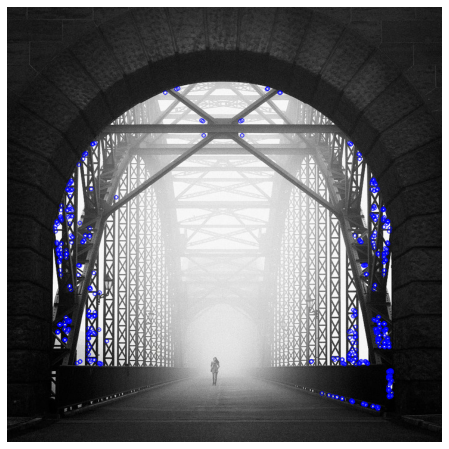

In [189]:

        
def draw_keyp(img, kp):
     """
     Takes image and keypoints and plots on the same images
     Does not display it.
     """
     cv2.drawKeypoints(img,kp,img, color=(255,0,0), flags=2)
     return img

    
def plot_img(img, figsize=(12,8)):
     """
     Plots image using matplotlib for the given figsize
     """
     fig = plt.figure(figsize=figsize)
     ax = fig.add_subplot(1,1,1)
     # image need to be converted to RGB format for plotting
     ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
     plt.axis('off')
     plt.show()
        
def main():
     # read an image
     filename = 'data_new/blackphoto.jpg'
     # compute ORB keypoints
     img1,kp1, des1 = compute_orb_keypoints(filename)
     # draw keypoints on image
     img1 = draw_keyp(img1, kp1)
     # plot image with keypoints
     plot_img(img1)
    
if __name__ == '__main__':
     main()



- 강력한 기능을 결합할 뿐만 아니라 다른 기능과 쉽게 비교할 수 있는 설명자를 제공하는 ORB 기능의 공식화를 보았다. 이는 형상 검출기의 강력한 공식이지만, 다른 작업에 대한 형상 검출기를 명시적으로 설계하려면 FAST 검출기의 패치 크기, BRIFF 설명자 매개변수 등과 같은 매개 변수를 효율적으로 선택해야 한다.

## The black box feature 
- 야간 영상이나 일광 영상과 같이 조도가 변경될 경우 주변 영역뿐만 아니라 픽셀 강도 값에도 상당한 차이가 있을 수 있다.
- 객체 방향이 변경됨에 따라 키포인트 설명자가 크게 변경됩니다. 해당 기능을 일치시키려면 적절한 설명자 매개 변수를 선택해야 합니다.
- 블랙박스 모델링 기능 감지는 이미지 데이터 세트를 학습하여 더 나은 기능을 얻는 데 도움이 된다. 
- 데이터 세트는 학습된 디텍터가 광범위한 이미지 유형에서도 더 나은 기능을 추출할 수 있기 때문에 가능한 다양한 이미지 변형으로 구성된다.
- 우리는 CNN으로 다음 장에서 이러한 기능 감지기를 연구할 것

### Application – find your object in an image 
- Black box 기능을 사용하기 위해 이미지에서 가장 적합한 개체를 찾는 기능을 사용하는데, 이를 템플릿 매칭이라고 부른다.
- 찾고자 하는 객체는 일반적으로 템플릿이라고 불리는 작은 창이며 목표는 이 템플릿에서 대상 이미지로 가장 잘 일치하는 특징을 계산하는 것이다. 
- 이를 위해 ORB의 기능을 사용할 것이며, 다음과 같이 무차별적으로 기능 일치를 수행할 것
  -  각 이미지(템플릿 및 대상)의 기능을 계산합니다.
  -  템플릿의 각 기능에 대해 이전에 탐지된 대상의 모든 기능을 비교합니다. 기준은 일치하는 점수를 사용하여 설정됩니다.
  -  형상 쌍이 기준을 통과하면 일치로 간주된다.
  -  시각화할 일치 항목 그리기

In [190]:
# 각 이미지의 키포인트와 설명자가 있으면 이를 사용하여 비교하고 일치시킬 수 있다 (이전 FAST 기능 코드)
def compute_orb_keypoints(filename):
     """
     Takes in filename to read and computes ORB keypoints
     Returns image, keypoints and descriptors
     """
     img = cv2.imread(filename)
     # create orb object
     orb = cv2.ORB_create()

     # set parameters
     orb.setScoreType(cv2.FAST_FEATURE_DETECTOR_TYPE_9_16)

     # detect keypoints
     kp = orb.detect(img,None)
     # using keypoints, compute descriptor
     kp, des = orb.compute(img, kp)
     return img, kp, des


In [191]:
# 두 영상 간의 키포인트를 일치시키는 작업
# 사용할 매트릭스의 거리를 지정하는 매처 종류 중 원하는 매처를 생성하기
# Brute-Force Matching with Hamming distance 사용

bf = cv2.BFMatcher(cv2.NORM_HAMMING2, crossCheck=True)

In [192]:
# 각 이미지의 키포인트에 대한 설명자를 사용하여 다음과 같이 일치시킵니다
matches = bf.match(des1,des2)


NameError: name 'des1' is not defined

In [193]:
# 해당 설명자만 사용하여 한 이미지에서 다른 이미지로 키포인트를 일치시키는 전체적인 브루트 포스 방법

def brute_force_matcher(des1, des2):
    """
    Brute force matcher to match ORB feature descriptors
    des1, des2: ORB 메소드 방법을 이용하여 계산된 2개의 이미지 설명자 
    returns matches
    """
    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING2, crossCheck=True)
    # Match descriptors.
    matches = bf.match(des1,des2)
    # Sort them in the order of their distance.
    matches = sorted(matches, key = lambda x:x.distance)
    return matches


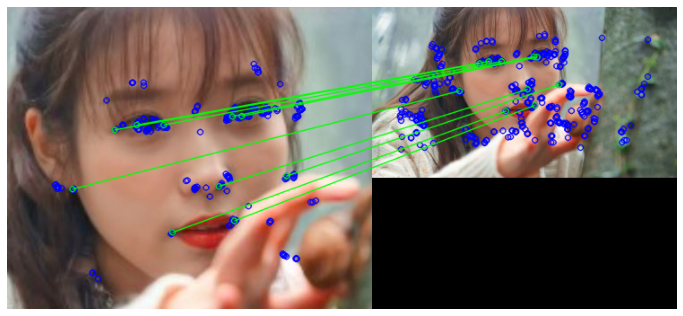

In [194]:
# 이전 기능 일치 이미지는 동일한 개체의 큰 이미지와 일치하기 위해 샘플 템플릿 이미지를 사용하는 다음 코드를 사용하여 생성됩니다.
def compute_img_matches(filename1, filename2, thres=10):
    """
    Extracts ORB features from given filenames
    Computes ORB matches and plot them side by side
    """
    img1, kp1, des1 = compute_orb_keypoints(filename1)
    img2, kp2, des2 = compute_orb_keypoints(filename2)

    matches = brute_force_matcher(des1, des2)
    draw_matches(img1, img2, kp1, kp2, matches, thres)

def draw_matches(img1, img2, kp1, kp2, matches, thres=10):
    """
    Utility function to draw lines connecting matches between two images.
    """
    draw_params = dict(matchColor = (0,255,0),
    singlePointColor = (255,0,0),
    flags = 0)
    # Draw first thres matches.
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:thres],None, **draw_params)
    plot_img(img3)
def main():
    # read an image
    filename1 = 'data_new/IU_face.jpg'
    filename2 = 'data_new/IU.jpg'
    compute_img_matches(filename1, filename2)

if __name__ == '__main__':
    main()

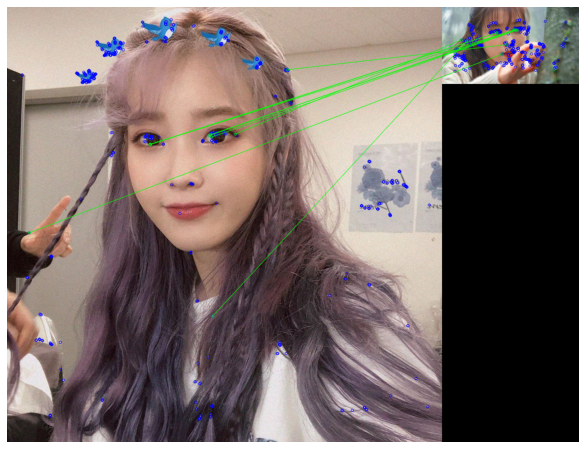

In [195]:
# IU의 다른 사진에도 적용이 될까???

def main():
    # read an image
    filename1 = 'data_new/IU_2.jpg'
    filename2 = 'data_new/IU.jpg'
    compute_img_matches(filename1, filename2)

if __name__ == '__main__':
    main()

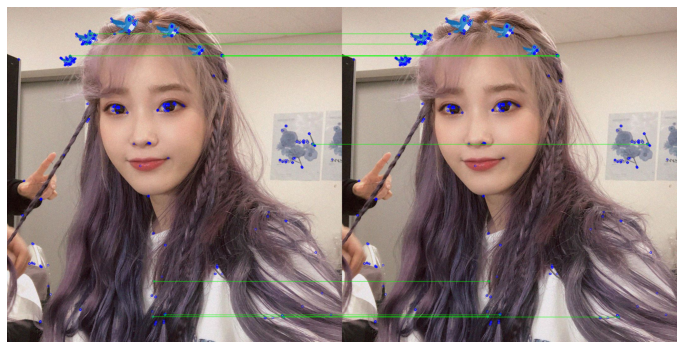

In [196]:
# IU의 다른 사진에도 적용이 될까???

def main():
    # read an image
    filename1 = 'data_new/IU_2.jpg'
    filename2 = 'data_new/IU_2.jpg'
    compute_img_matches(filename1, filename2)

if __name__ == '__main__':
    main()

## Applications – is it similar? 
- 응용 프로그램에서는 앞에서 설명한 형상 검출기를 사용하여 유사한지 여부를 확인하려고 한다
- 첫 번째 단계는 각 이미지에 대한 기능 키포인트 및 설명자를 계산하는 것입니다. 이 옵션을 사용하면 한 이미지와 다른 이미지가 일치합니다
- 일치 횟수가 충분하면 두 이미지가 비슷하다고 편하게 말할 수 있습니다. 사전 요구 사항의 경우 동일한 ORB 키포인트 및 설명자 추출기를 사용하지만 이미지의 다운샘플링을 추가했습니다.

In [197]:
def compute_orb_keypoints(filename):
    """
    Takes in filename to read and computes ORB keypoints
    Returns image, keypoints and descriptors
    """
    img = cv2.imread(filename)

    # downsample image 4x
    img = cv2.pyrDown(img) # downsample 2x
    img = cv2.pyrDown(img) # downsample 4x
    # create orb object
    orb = cv2.ORB_create()

    # set parameters
    orb.setScoreType(cv2.FAST_FEATURE_DETECTOR_TYPE_9_16) #파라미터 값 업데이트

    # detect keypoints
    kp = orb.detect(img,None)
    kp, des = orb.compute(img, kp)
    return img, kp, des


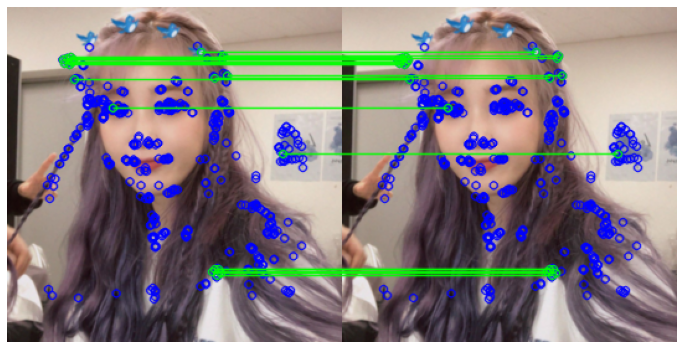

In [198]:
# 다른 키포인트를 사용하여 이전에 표시된 수치를 표시하려면 OpenCV 및 Matplot lib를 모두 사용할 수 있습니다.

def compute_img_matches(filename1, filename2, thres=10):
    """
    Extracts ORB features from given filenames
    Computes ORB matches and plot them side by side
    """
    img1, kp1, des1 = compute_orb_keypoints(filename1)
    img2, kp2, des2 = compute_orb_keypoints(filename2)

    matches = brute_force_matcher(des1, des2)
    draw_matches(img1, img2, kp1, kp2, matches, thres)

def brute_force_matcher(des1, des2):
    """
    Brute force matcher to match ORB feature descriptors
    """
    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING2, crossCheck=True)
    # Match descriptors.
    matches = bf.match(des1,des2)
    # Sort them in the order of their distance.
    matches = sorted(matches, key = lambda x:x.distance)
    return matches
def draw_matches(img1, img2, kp1, kp2, matches, thres=10):
    """
    Utility function to draw lines connecting matches between two images.
    """
    draw_params = dict(matchColor = (0,255,0),
    singlePointColor = (255,0,0),
    flags = 0)
    # Draw first thres matches.
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:thres],None, **draw_params)
    plot_img(img3)
def main():
    # read an image
    filename2 = 'data_new/IU_2.jpg'
    filename1 = 'data_new/IU_2.jpg'
    compute_img_matches(filename1, filename2, thres=20)
if __name__ == '__main__':
    main()


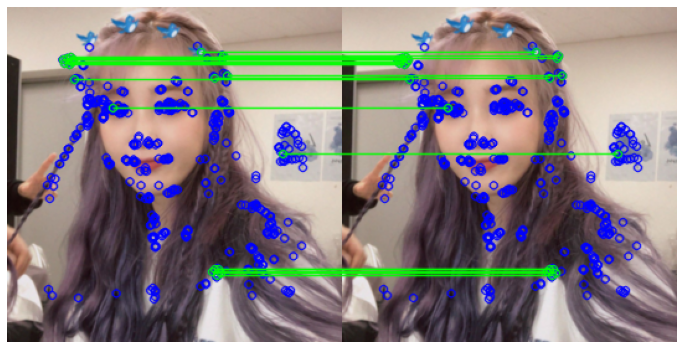

In [199]:
# 다른 키포인트를 사용하여 이전에 표시된 수치를 표시하려면 OpenCV 및 Matplot lib를 모두 사용할 수 있습니다.

def compute_orb_keypoints(filename):
    """
    Takes in filename to read and computes ORB keypoints
    Returns image, keypoints and descriptors
    """
    img = cv2.imread(filename)

    # downsample image 4x
    img = cv2.pyrDown(img) # downsample 2x
    img = cv2.pyrDown(img) # downsample 4x
    # create orb object
    orb = cv2.ORB_create()

    # set parameters
    orb.setScoreType(cv2.FAST_FEATURE_DETECTOR_TYPE_9_16) #파라미터 값 업데이트

    # detect keypoints
    kp = orb.detect(img,None)
    kp, des = orb.compute(img, kp)
    return img, kp, des
def compute_img_matches(filename1, filename2, thres=10):
    """
    Extracts ORB features from given filenames
    Computes ORB matches and plot them side by side
    """
    img1, kp1, des1 = compute_orb_keypoints(filename1)
    img2, kp2, des2 = compute_orb_keypoints(filename2)

    matches = brute_force_matcher(des1, des2)
    draw_matches(img1, img2, kp1, kp2, matches, thres)

def brute_force_matcher(des1, des2):
    """
    Brute force matcher to match ORB feature descriptors
    """
    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING2, crossCheck=True)
    # Match descriptors.
    matches = bf.match(des1,des2)
    # Sort them in the order of their distance.
    matches = sorted(matches, key = lambda x:x.distance)
    return matches
def draw_matches(img1, img2, kp1, kp2, matches, thres=10):
    """
    Utility function to draw lines connecting matches between two images.
    """
    draw_params = dict(matchColor = (0,255,0),
    singlePointColor = (255,0,0),
    flags = 0)
    # Draw first thres matches.
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:thres],None, **draw_params)
    plot_img(img3)
def main():
    # read an image
    filename2 = 'data_new/IU_2.jpg'
    filename1 = 'data_new/IU_2.jpg'
    compute_img_matches(filename1, filename2, thres=20)
if __name__ == '__main__':
    main()

In [200]:
    filename2 = 'data_new/IU.jpg'
    filename1 = 'data_new/IU_2.jpg'

In [201]:
len(filename2)

15

- 여기서 입력은 서로 다른 관점을 가진 동일한 개체입니다. 올바른 일치는 연결 선과 같이 표시됩니다.
- ORB 키포인트와 브루트-포스 매치를 사용하여 이미지 일치를 위한 두 가지 유사한 접근 방식을 보았다.
- 근사 인접 일치와 같은 더 빠른 알고리즘을 사용하면 일치를 더욱 향상시킬 수 있다.
- 더 빠른 일치의 효과는 대부분 특징 키포인트가 많이 추출되는 경우에 나타난다.

## 4챕터 요약
- 이미지 분석을 위해 점 필터와 비선형 필터뿐만 아니라 더 복잡한 선형 필터로 확장했다.
- 커널 크기 등과 같은 다양한 매개 변수에 대한 결과의 시각화를 보았다.
- 히스토그램 평준화와 같은 비선형 필터는 선형 필터로 수행하기 어려운 영상을 추가로 조정할 수 있습니다. 
- 한 매개 변수를 다르게 선택할 수 있는 출력을 시각화하여 변환, 회전 및 아핀 변환과 같은 다양한 변환 방법을 보았다.
- 다양한 변환이 계단식 방식으로 적용되어 결합된 변환 결과를 생성할 수 있습니다
-  마지막으로, 각각 계산을 더 빠르게 하거나 더 풍부한 정보를 추출하는 데 중요한 역할을 하는 이미지 다운샘플링 및 업샘플링 방법이 도입

## 5챕터 Convolutional Neural Networks (p 75~)
- 코드만 입력하고 패스 


In [ ]:
dim_x = 1000 # input dims
dim_y = 2 # output dims

In [ ]:
def net(x, w):
    """
    A simple neural net that performs non-linear transformation
    Function : 1 / (1 + e^(-w*x))
    x: inputs
    w: weight matrix
    Returns the function value
    """
    return 1/(1+np.exp(-x.dot(w)))

In [ ]:
# feed forward pass
y_pred = net(x, w)
# compute loss
loss = compute_loss(y, y_pred)
print("Loss:", loss, "at step:", i)
# compute grads using backprop on given net
w_grad = backprop(y, y_pred, w, x)
# update weights with some learning rate
w -= lr * w_grad

In [ ]:
def compute_loss(y, y_pred):
 """
 Loss function : sum(y_pred**2 - y**2)
 y: ground truth targets
 y_pred: predicted target values
 """
 return np.mean((y_pred-y)**2)


In [ ]:
import numpy as np
dim_x = 1000 # input dims
dim_y = 2 # output dims
batch = 10 # batch size for training
lr = 1e-4 # learning rate for weight update
steps = 5000 # steps for learning
# create random input and targets
x = np.random.randn(batch, dim_x)
y = np.random.randn(batch, dim_y)
# initialize weight matrix
w = np.random.randn(dim_x, dim_y)
def net(x, w):
    """
    A simple neural net that performs non-linear transformation
    Function : 1 / (1 + e^(-w*x))
    x: inputs
    w: weight matrix
    Returns the function value
    """
    return 1/(1+np.exp(-x.dot(w)))
def compute_loss(y, y_pred):
    """
    Loss function : sum(y_pred**2 - y**2)
    y: ground truth targets
    y_pred: predicted target values
    """
    return np.mean((y_pred-y)**2)
def backprop(y, y_pred, w, x):
    """
    Backpropagation to compute gradients of weights
    y : ground truth targets
    y_pred : predicted targets
    w : weights for the network
    x : inputs to the net
    """
    # start from outer most
    y_grad = 2.0 * (y_pred - y)
    # inner layer grads
    w_grad = x.T.dot(y_grad * y_pred * (1 - y_pred))
    return w_grad
for i in range(steps):
    # feed forward pass
    y_pred = net(x, w)
    # compute loss
    loss = compute_loss(y, y_pred)
    print("Loss:", loss, "at step:", i)
    # compute grads using backprop on given net
    w_grad = backprop(y, y_pred, w, x)
    # update weights with some learning rate
    w -= lr * w_grad

In [ ]:
y = Conv2D(filters=32,
 kernel_size=(5,5),
 strides=1, padding="same")(x)


In [ ]:
def compute_loss(y, y_pred):
 """
 Loss function : sum(y_pred**2 - y**2)
 y: ground truth targets
 y_pred: predicted target values
 """
 return np.mean((y_pred-y)**2)


In [ ]:
import numpy as np
dim_x = 1000 # input dims
dim_y = 2 # output dims
batch = 10 # batch size for training
lr = 1e-4 # learning rate for weight update
steps = 5000 # steps for learning
# create random input and targets
x = np.random.randn(batch, dim_x)
y = np.random.randn(batch, dim_y)
# initialize weight matrix
w = np.random.randn(dim_x, dim_y)
def net(x, w):
    """
    A simple neural net that performs non-linear transformation
    Function : 1 / (1 + e^(-w*x))
    x: inputs
    w: weight matrix
    Returns the function value
    """
    return 1/(1+np.exp(-x.dot(w)))
def compute_loss(y, y_pred):
    """
    Loss function : sum(y_pred**2 - y**2)
    y: ground truth targets
    y_pred: predicted target values
    """
    return np.mean((y_pred-y)**2)
def backprop(y, y_pred, w, x):
    """
    Backpropagation to compute gradients of weights
    y : ground truth targets
    y_pred : predicted targets
    w : weights for the network
    x : inputs to the net
    """
    # start from outer most
    y_grad = 2.0 * (y_pred - y)
    # inner layer grads
    w_grad = x.T.dot(y_grad * y_pred * (1 - y_pred))
    return w_grad
    for i in range(steps):
    # feed forward pass
    y_pred = net(x, w)
    # compute loss
    loss = compute_loss(y, y_pred)
    print("Loss:", loss, "at step:", i)
    # compute grads using backprop on given net
    w_grad = backprop(y, y_pred, w, x)
    # update weights with some learning rate
    w -= lr * w_grad

In [ ]:
kernel = np.ones((5,5),np.float32)/25
dst = cv2.filter2D(gray,-1,kern

In [ ]:
y = Conv2D(filters=32,
 kernel_size=(5,5),
 strides=1, padding="same")(x)


In [ ]:
# Convolutional Neural Networks

from keras.layers import Conv2D, Input
from keras.models import Model
def print_model():
    """
    Creates a sample model and prints output shape
    Use this to analyse convolution parameters
    """
    # create input with given shape
    x = Input(shape=(512,512,3))
    # create a convolution layer
    y = Conv2D(filters=32,
    kernel_size=(5,5),
    strides=1, padding="same",
    use_bias=False)(x)

    # create model
    model = Model(inputs=x, outputs=y)
    # prints our model created
    model.summary()
print_model()


In [ ]:
# The activation layer
from keras.layers import Conv2D, Input, Activation
from keras.models import Model
def print_model():
    """
    Creates a sample model and prints output shape
    Use this to analyse convolution parameters
    """
    # create input with given shape
    x = Input(shape=(512,512,3))
    # create a convolution layer
    conv = Conv2D(filters=32,
    kernel_size=(5,5),
    strides=1, padding="same",
    use_bias=True)(x)

    # add activation layer
    y = Activation('relu')(conv)

    # create model
    model = Model(inputs=x, outputs=y)
    # prints our model created
    model.summary()
    print_model() 

In [ ]:
conv = Conv2D(filters=32,
 kernel_size=(5,5), activation="relu",
 strides=1, padding="same",
 use_bias=True)(x)


- Pooling layer :  입력 데이터 크기를 축소시키고, 학습하지 않아 파라미터가 줄어 오버피팅(Overfitting)이 발생하는 것을 방지한다. 합성곱 층이 많은양의 메모리를 필요로 하기 때문에 계산량을 줄여주기 위해 부표본(subSample)을 만드는데, 이는 측면에서 큰 장점이 있다. 

In [ ]:
from keras.layers import Conv2D, Input, MaxPooling2D
from keras.models import Model
def print_model():
    """
    Creates a sample model and prints output shape
    Use this to analyse Pooling parameters
    """
    # create input with given shape
    x = Input(shape=(512,512,3))
    # create a convolution layer
    conv = Conv2D(filters=32,
    kernel_size=(5,5), activation="relu",
    strides=1, padding="same",
    use_bias=True)(x)
    pool = MaxPooling2D(pool_size=(2,2))(conv)

    # create model
    model = Model(inputs=x, outputs=pool)
    # prints our model created
    model.summary()
print_model()


In [ ]:
# The fully connected layer 
from keras.layers import Dense, Input
from keras.models import Model
def print_model():
    """
    Creates a sample model and prints output shape
    Use this to analyse dense/Fully Connected parameters
    """
    # create input with given shape
    x = Input(shape=(512,))
    # create a fully connected layer layer
    y = Dense(32)(x)

    # create model
    model = Model(inputs=x, outputs=y)
    # prints our model created
    model.summary()
print_model()


In [ ]:
# CNN in practice 
from keras.datasets import fashion_mnist
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

def conv3x3(input_x,nb_filters):
    """
    Wrapper around convolution layer
    Inputs:
    input_x: input layer / tensor
    nb_filter: Number of filters for convolution
    """
    return Conv2D(nb_filters, kernel_size=(3,3), use_bias=False,
                        activation='relu', padding="same")(input_x)
x = MaxPooling2D(pool_size=(2,2))(input)
preds = Dense(nb_class, activation='softmax')(x)


In [ ]:
def create_model(img_h=28, img_w=28):
    """
    Creates a CNN model for training.
    Inputs:
    img_h: input image height
    img_w: input image width
    Returns:
    Model structure
    """

    inputs = Input(shape=(img_h, img_w, 1))
    x = conv3x3(inputs, 32)
    x = conv3x3(x, 32)
    x = MaxPooling2D(pool_size=(2,2))(x)
    x = conv3x3(x, 64)
    x = conv3x3(x, 64)
    x = MaxPooling2D(pool_size=(2,2))(x)
    x = conv3x3(x, 128)
    x = MaxPooling2D(pool_size=(2,2))(x)
    x = Flatten()(x)
    x = Dense(128, activation="relu")(x)
    preds = Dense(nb_class, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=preds)
    print(model.summary())
    return model


In [ ]:
# Fashion-MNIST classifier training code 
import keras
import keras.backend as K
from keras.layers import Dense, Conv2D, Input, MaxPooling2D, Flatten
from keras.models import Model
from keras.datasets import fashion_mnist
from keras.callbacks import ModelCheckpoint


# setup parameters
batch_sz = 128 # batch size
nb_class = 10 # target number of classes
nb_epochs = 10 # training epochs
img_h, img_w = 28, 28 # input dimensions
def get_dataset():
    """
    Return processed and reshaped dataset for training
    In this cases Fashion-mnist dataset.
    """
    # load mnist dataset
    (x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

    # test and train datasets
    print("Nb Train:", x_train.shape[0], "Nb test:",x_test.shape[0])
    x_train = x_train.reshape(x_train.shape[0], img_h, img_w, 1)
    x_test = x_test.reshape(x_test.shape[0], img_h, img_w, 1)
    in_shape = (img_h, img_w, 1)
    # normalize inputs
    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
    x_train /= 255.0
    x_test /= 255.0
    # convert to one hot vectors
    y_train = keras.utils.to_categorical(y_train, nb_class)
    y_test = keras.utils.to_categorical(y_test, nb_class)
    return x_train, x_test, y_train, y_test
            x_train, x_test, y_train, y_test = get_dataset()


In [ ]:
def conv3x3(input_x,nb_filters):
    """
    Wrapper around convolution layer
    Inputs:
    input_x: input layer / tensor
    nb_filter: Number of filters for convolution
    """
    return Conv2D(nb_filters, kernel_size=(3,3), use_bias=False,
    activation='relu', padding="same")(input_x)
def create_model(img_h=28, img_w=28):
    """
    Creates a CNN model for training.
    Inputs:
    img_h: input image height
    img_w: input image width
    Returns:
    Model structure
    """

    inputs = Input(shape=(img_h, img_w, 1))
    x = conv3x3(inputs, 32)
    x = conv3x3(x, 32)
    x = MaxPooling2D(pool_size=(2,2))(x)
    x = conv3x3(x, 64)
    x = conv3x3(x, 64)
    x = MaxPooling2D(pool_size=(2,2))(x)
    x = conv3x3(x, 128)
    x = MaxPooling2D(pool_size=(2,2))(x)
    x = Flatten()(x)
    x = Dense(128, activation="relu")(x)
    preds = Dense(nb_class, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=preds)
    print(model.summary())
    return model
model = create_model()


In [ ]:
# setup optimizer, loss function and metrics for model
model.compile(loss=keras.losses.categorical_crossentropy,
 optimizer=keras.optimizers.Adam(),
 metrics=['accuracy'])
# To save model after each epoch of training
callback = ModelCheckpoint('mnist_cnn.h5')  
# start training
model.fit(x_train, y_train,
 batch_size=batch_sz,
 epochs=nb_epochs,
 verbose=1, validation_data=(x_test, y_test),
 callbacks=[callback])
# Evaluate and print accuracy
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

In [ ]:
# VGGNet 
from keras.applications.vgg16 import VGG16
def print_model():
    """
    Loads VGGNet and prints model structure
    """

    # create model
    model = VGG16(weights='imagenet')
    # prints our model created
    model.summary()
print_model()


In [ ]:
# Inception models 
from keras.applications.inception_v3 import InceptionV3
def print_model():
    """
    Loads InceptionV3 model and prints model structure
    """

    # create model
    model = InceptionV3(weights='imagenet')
    # prints our model created
    model.summary()
print_model()

In [ ]:
# ResNet model 
def get_model():
    """
    Loads Resnet and prints model structure
    Returns resnet as model.
    """

    # create model
    model = ResNet50(weights='imagenet')
    # To print our model loaded
    model.summary()
    return model
def preprocess_img(img):
    # apply opencv preprocessing
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    img = img[np.newaxis, :, :, :]
    # convert to float type
    img = np.asarray(img, dtype=np.float)

    # further use imagenet specific preprocessing
    # this applies color channel specific mean normalization
    x = preprocess_input(img)
    print(x.shape)
    return x

In [ ]:
# read input image and preprocess
img = cv2.imread('../figures/train1.png')
input_x = preprocess_img(img)
# create model with pretrained weights
resnet_model = get_model()
# run predictions only , no training
start = time.time()
preds = resnet_model.predict(input_x)
print(time.time() - start)

# decode prediction to index of classes, top 5 predictions
print('Predicted:', decode_predictions(preds, top=5)[0])


## 6챕터 Feature-Based Object Detection

- CNN을 모델링하여 이미지의 객체가 어디에 있는지 탐지하고 미리 결정된 범주 중 하나로 객체를 분류하는 방법에 알아보자
  - 이미지 인식 및 객체 감지란 무엇인가?
  - OpenCV를 이용하여 널리 사용되는 얼굴 감지 기법의 작업의 예
  - Faster-RCNN과 같은 2단계 모델을 이용한 객체 감지
  - SSD와 같은 1단계 모델을 사용한 객체 감지

### Introduction to object detection
- 이미지 모델은 다음과 같은 정보를 예측할 수 있는 일반적인 이미지 인식을 수행합니다
    - 이미지에 있는 객체의 클래스 이름
    - 객체 중심 픽셀 위치
    - 객체를 출력으로 둘러싼 경계 상자
    - 각 픽셀이 클래스로 분류되는 이미지. 클래스는 개체와 배경을 위한 것.
- 흔히 말하는 물체 감지란, 첫 번째와 세 번쨰 유형의 이미지 인식을 가르킨다.

### Challenges in object detection
- 과거에도 객체 감지를 위한 몇가지 접근 방식이 제안되었으나 이것들은 통제된 환경에서 수행되거나 사람의 얼굴과 같은 이미지에서 특별한 물체를 찾는 등의 한계가 있었다.
- 객체 감지기의 문제
  - Occlusion(폐색) : 개나 고양이 같은 물체들이 앞, 뒤로 배치되어 있을 때, 정면에서 분석 시, 물체에서 추출할 수 있는 특징이 개체라고 말할 만큼 강하지 않다.
  - Viewpoint Changes : 객체의 관점이 다른 경우, 형상이 급격히 변화할 수 있어 특징도 크게 변하게 된다.이로 인하여 특정 개체를 한 관점애서 보도록 훈련된 디텍터는 다른 관점에서 보지 못하게 된다. 
  - Variation in sizes(크기 변동) : 같은 물체가 카메라에서 떨어진 거리에 따라 객체 크기가 변하게 된다.따라서 크기 불변 및 회전 불변이어야 한다.
  - Non-rigid objects : 물체의 모양이 부분으로 갈라지거나 유동적인 물체가 있는 경우, 특징을 사용하여 그것들을 묘사하는 것은 어려워진다.
  - Motion-blur : 차 처럼 움직이는 차체를 감지하다보면 카메라에 잡힌 이미지가 흐릿해지는 경우가 있을 수 있다. 

### Methods for object detection
- 물체 감지는 두단계의 문제를 처리해야 한다.
  - 이미지 내에서 개체 또는 여러 개체를 현지화해야 한다.
  - 지역화된 각 개체에 대해 예측된 클래스를 제공한다. 
  - 슬라이딩 윈도우 기반 접근법을 사용하는 몇 가지 객체 감지 방법 중 얼굴 감지법이 있는데, 인간의 얼굴이 입가에 비해 어두운 눈가 부위  등 강한 서술적 특징을 갖고 있다는 점을 이용했다. 코 근처의 직사각형 영역과 눈을 둘러싼 직사각형 영역 등  직사각형 간 영역 차이를 계산했다.

In [ ]:
# 특정 객체 탐지(얼굴 감지)를 위한 매개 변수가 있는 분류기 만들기
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_default.xml')


In [ ]:
# 두 번째 단계에서는 각 이미지에 대해 이전에 로드된 분류기 파라미터를 사용하여 얼굴 탐지를 수행합니다.
faces = face_cascade.detectMultiScale(gray)


In [ ]:
# OpenCV
import numpy as np
import cv2
# create cascaded classifier with pre-learned weights
# For other objects, change the file here
face_cascade = cv2.CascadeClassifier('data_new/haarcascade_frontalface_default.xml')
cap = cv2.VideoCapture(0)
while(True):
    ret, frame = cap.read()
    if not ret:
        print("No frame captured")

    # frame = cv2.resize(frame, (640, 480))
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # detect face
    faces = face_cascade.detectMultiScale(gray)
    # plot results
    for (x,y,w,h) in faces:
        cv2.rectangle(frame,(x,y),(x+w,y+h),(255,0,0),2)
        cv2.imshow('img',frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

## Deep learning-based object detection 
- 객체를 감지하려면 클래스 확률과 경계 상자 직사각형 좌표 및 모양을 모두 출력하도록 값을 수정해야 한다.
- 초기 CNN 기반 객체 감지 기능은 다음과 같이 행해졌다.
  - CNN 기반 객체 감지 기능 입력 이미지에서 가능한 창을 계산한 다음, 창에 대한 CNN 모델을 사용하여 기능을 계산한다.
  - CNN 기능 추출기의 출력이 우리에게 선창이 대상 개체인지 여부를 알려준다.
- 각 창을 대량으로 계산하기 때문에 속도가 느리다.
- 때문에, 직관적으로 이미지에서 특징을 추출하고, 특징을 물체 감지에 이용하여, 감지 속도 향상과 이미지에서 원하지 않는 노이즈를 필터링하고자 한다.


## 속도와 정확성 문제 해결하기
- Two-stage detectors : 프로세스를 크게 두단계로 나누며, 가장 인기 있는 검출기는 Faster R-CNN 이다. 
- One-stage detectors : Two-stage detectors에서 검출 정확도는 높였지만 훈련이 어렵고 실시간 조작 속도는 단축되었다.
  때문에 단일 아키텍처로 네트워크를 만들어 이러한 문제를 해결했다. 대표적인 모델이 SSD(Single Shot Multibox Detector)

## Two-stage detectors 
- CNN을 초기 접근 방식을 Two-stage detectors 을 이용하여 설명해보자
  - 첫 단계에서 이미지에서 형상을 추출하고 관심 영역(ROI)를 제안한다 ROI는 개체가 영상에 있을 수 있는 가능한 상자로 구성됌.
  - 두 번째 단계에서 특징과 ROI를 이용하여 각 상자에 대한 최종 경계 상자 및 클래스 확률을 계산한다. 이를 이용하여 최종 산출물을 구성한다.
  

### Faster R-CNN
- 입력 이미지는 피쳐 및 영역 제안을 추출하는데 사용된다.
- 추출된 이러한 특징과 제안은 각 상자에 대해 예측된 경계 상자 및 클래스 확률을 계산하는데 함께 사용
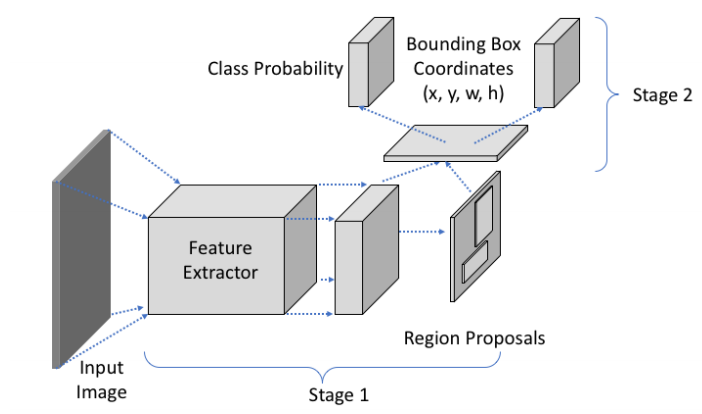

- 1단계 훈련 중에 모델이 먼저 RPN(Region Proposal Network)라는 하위 모델을 사용하여 ROI를 생성하는 방법을 배운다.
- 2단계에서 ROI와 기능을 사용하여 올바른 클래스 확률 및 경계 상자 위치를 생성하는 방법을 학습한다.

- RPN 네트워크는 아래 그림과 같으며, 입력으로 경계 상자 및 해당 확률에 대한 제안이 생성됨에 따라 피쳐 계층을 사용한다.

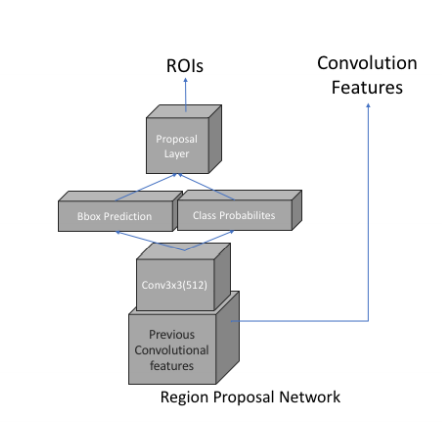

- 경계 상자 위치는 일반적으로 너비 및 높이 값을 가진 상자의 왼쪽 상단 좌표에 대해 정규화된 값이지만, 모델 학습 방법에 따라 달라질 수 있다.
- 예측 중 모델은 (x,y,w,h) 형식의 경계 상자 위치 분 아니라 클래스 확률, 클래스 범주 집합을 출력합니다. 이 세트는 다시 임계값을 통과하여 신뢰 점수가 임계값 보다 낮은 경계 상자를 필터링한다.

- Faster R-CNN은 최첨단 탐지 정확도를 달성하여 1단 검출기보다 정확도가 더 우수한 장점이 있으나 속도가 느리다는 단점이 존재한다.
- 애플리케이션 예측에서 시간이 중요한 경우 1단계 검출기를 사용하는 것이 좋다.
- 그러나, 최상의 정확도를 얻기 위한 요구 조건이라면, Faster R-CNN을 사용하는 것을 강력히 권장한다.
- 개체 크기가 작은 경우에도 Faster R-CNN의 2단계 모델이 정확하게 예측한다.

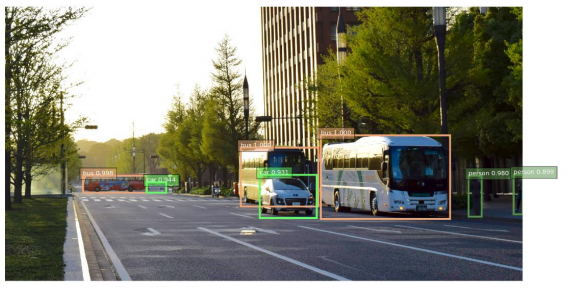

### Demo – Faster R-CNN with ResNet-101  (Pass)
- Tensorflow를 이용한 유사 예측
    - 먼저 리포지토리를 복제하는 것 부터 시작한다.
    


## One-stage detectors 
- 2단계 검출기가 네트워크를 두개로 분할하여 예측시간이 더 느리고 훈련이 더 어려운 문제가 있다.
- SSD(Single Shot Multibox Detectors )와 같이 최근 제안된 네트워크에서는 중간 단계를 제거하여 예측 시간이 단축되고 교육은 항상 End-to-end
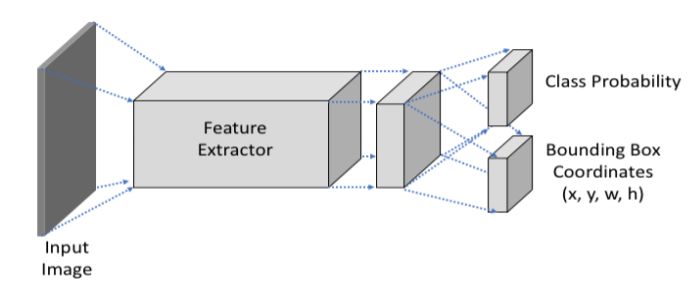
- 네트워크의 전체 출력은 2단계와 동일하며, 형태는 (x,y,w,h)이며 (x,y)는 직사각형의 왼쪽 상단 모서리이고 (w,h)는 각각 상자의 폭과 높이이다.
- 다중 해상도를 사용하기 위홰 모델은 형상 추출의 최종 레이어뿐만 아니라 여러 중간 형상 레이어도 사용.
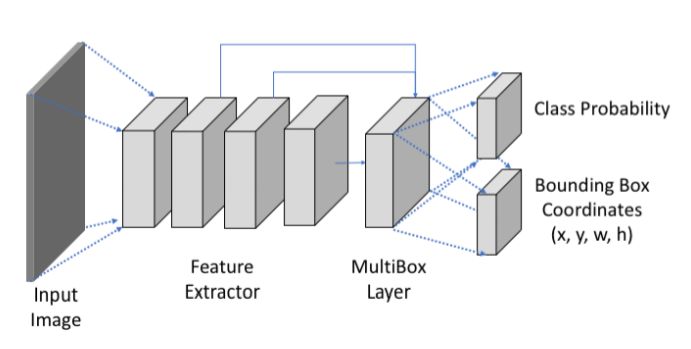
- 탐지 속도를 더욱 높이기 위해 모델은 비최소 억제라는 기술도 사용한다.
- 그러면 지정된 영역과 범주에 대해 최대 점수가 없는 모든 경계 상자가 표시되지 않는다
- 멀티 박스 계층의 총 출력 상자가 크게 감소하므로 이미지에서 클래스당 높은 점수를 받은 탐지만 있다.


In [ ]:
import protobuf

protoc object_detection/protos/*.proto --python_out=.


## Segmentation and Tracking
- 어플리케이션이 개체 주위에 인스턴스(instance)라고 하는 정확한 경계를 요구하면 다른 접근 방식을 적용해야 한다
- 분할은 종종 유사한 범주의 픽셀의 군집화라고 불린다
- mage intensity levels
